# Download MNIST Datset
Dataset이 없는 최초 1회만 실행

In [1]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [2]:
%cd /content/gdrive/MyDrive/MNIST

/content/gdrive/MyDrive/MNIST


In [3]:
%pwd

'/content/gdrive/MyDrive/MNIST'

In [5]:
# Download MNIST
!wget --no-check-certificate http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz
!wget --no-check-certificate http://yann.lecun.com/exdb/mnist/train-labels-idx1-ubyte.gz
!wget --no-check-certificate http://yann.lecun.com/exdb/mnist/t10k-images-idx3-ubyte.gz
!wget --no-check-certificate http://yann.lecun.com/exdb/mnist/t10k-labels-idx1-ubyte.gz
!gzip -f -d train-images-idx3-ubyte.gz
!gzip -f -d train-labels-idx1-ubyte.gz
!gzip -f -d t10k-images-idx3-ubyte.gz
!gzip -f -d t10k-labels-idx1-ubyte.gz

--2023-06-14 08:55:50--  http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz
Resolving yann.lecun.com (yann.lecun.com)... 188.114.97.0, 188.114.96.0, 2a06:98c1:3121::, ...
Connecting to yann.lecun.com (yann.lecun.com)|188.114.97.0|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9912422 (9.5M) [application/x-gzip]
Saving to: ‘train-images-idx3-ubyte.gz’

train-images-idx3-u 100%[===================>]   9.45M  --.-KB/s    in 0.1s    

2023-06-14 08:55:50 (76.4 MB/s) - ‘train-images-idx3-ubyte.gz’ saved [9912422/9912422]

--2023-06-14 08:55:50--  http://yann.lecun.com/exdb/mnist/train-labels-idx1-ubyte.gz
Resolving yann.lecun.com (yann.lecun.com)... 188.114.97.0, 188.114.96.0, 2a06:98c1:3121::, ...
Connecting to yann.lecun.com (yann.lecun.com)|188.114.97.0|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28881 (28K) [application/x-gzip]
Saving to: ‘train-labels-idx1-ubyte.gz’

train-labels-idx1-u 100%[===================>]  28.20K  

# Dataset & Dataloader

In [4]:
import numpy as np
import torch
from PIL import Image
from torchvision.datasets.mnist import read_image_file, read_label_file
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import os
from torchvision import transforms, utils, models
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Custom Dataloader to separate 0 and 1~9 label data.
class custom_MNIST(torch.utils.data.Dataset):
    training_file = "training.pt"
    test_file = "test.pt"

    def __init__(self, root = './', train = True, transform=None, random_aug=False):
        super().__init__()
        self.root = root  
        self.train = train  # training set(True) or test set(False)
        self.data, self.targets = self._load_data()
        self.transform = transform
        self.random_aug = random_aug

        if self.train: 
          self._del_zeros()

    def _load_data(self):
        image_file = f"{'train' if self.train else 't10k'}-images-idx3-ubyte"
        data = read_image_file(os.path.join(self.root, image_file))
        label_file = f"{'train' if self.train else 't10k'}-labels-idx1-ubyte"
        targets = read_label_file(os.path.join(self.root, label_file))
        return data, targets
    
    def _del_zeros(self):
        idx = self.targets != 0
        self.data = self.data[idx]
        self.targets = self.targets[idx]

    def __getitem__(self, index):
        img, target = self.data[index], int(self.targets[index])
        img = img.numpy()
        if self.random_aug == True: 
          dot_intensity = 255  # Intensity of the dot (before normalization)
          x1_coord = np.random.randint(3, 22)
          y1_coord = np.random.randint(3, 22)
          x2_coord = np.random.randint(3, 22)
          y2_coord = np.random.randint(3, 22)
          # Set the pixel value at the coordinates to represent the dot
          img[x1_coord:x1_coord+3, y1_coord:y1_coord+3] = dot_intensity
          img[x2_coord:x2_coord+3, y2_coord:y2_coord+3] = dot_intensity

        if self.transform is not None:
          img = self.transform(img)

        return img, target

    def __len__(self):
        return len(self.data)

In [5]:
class Meter:
    def __init__(self):
        self.list = []
    def update(self, item):
        self.list.append(item)
    def avg(self):
        return torch.tensor(self.list).mean() if len(self.list) else None

def compute_accuracy(logits, labels):
  pred = torch.argmax(logits, dim=1)
  zero_idx= ((labels==0).nonzero(as_tuple=True)[0])
  else_idx= ((labels!=0).nonzero(as_tuple=True)[0])

  if len(zero_idx) == 0:
    zero_acc = None
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  else:
    zero_acc = (pred[zero_idx] == labels[zero_idx]).type(torch.float).mean().item()*100
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  return zero_acc, else_acc

In [6]:
# subtracting perturbation: reversal FGSM attack code
def subtract_perturbation(image, epsilon, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image - epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

# restores the tensors to their original scale
def denorm(batch, mean=[0.5], std=[0.5]):
    if isinstance(mean, list):
        mean = torch.tensor(mean).to(device)
    if isinstance(std, list):
        std = torch.tensor(std).to(device)

    return batch * std.view(1, -1, 1, 1) + mean.view(1, -1, 1, 1)

In [7]:
def plot_discriminator_scores(prediction_results, ground_truth_labels):
    # Create a list to store the prediction scores for each label
    prediction_scores = [[] for _ in range(10)]

    # Iterate over the prediction results and ground truth labels
    for prediction, label in zip(prediction_results, ground_truth_labels):
        prediction_scores[label].append(prediction)

    # Create a figure with a single subplot
    fig, ax = plt.subplots(figsize=(8, 6))

    # Create a violin plot for the prediction scores of each label
    sns.violinplot(data=prediction_scores, ax=ax, inner="quartile")

    ax.set_title("Discriminator Scores for Each Label")
    ax.set_xlabel("Label")
    ax.set_ylabel("Discriminator Prediction Score - Real:0, Fake:1")

    ax.set_xticks(np.arange(10))
    ax.set_xticklabels(np.arange(10))

    # Calculate and plot median values for each label
    medians = [np.median(scores) for scores in prediction_scores]
    for i, median in enumerate(medians):
        ax.text(i, median, f"{median:.2f}", horizontalalignment='center', verticalalignment='center',
                fontweight='bold', color='white')
        # Overlay a dot representing the median value
        ax.plot(0.5, median, marker='o', markersize=5, color='white')

    plt.show()

In [8]:
def plot_variance_scores(prediction_results, ground_truth_labels):
    # Create a list to store the prediction scores for each label
    prediction_scores = [[] for _ in range(10)]

    # Iterate over the prediction results and ground truth labels
    for prediction, label in zip(prediction_results, ground_truth_labels):
        prediction_scores[label].append(prediction)

    # Create a figure with a single subplot
    fig, ax = plt.subplots(figsize=(5, 3))

    # Create a violin plot for the prediction scores of each label
    sns.violinplot(data=prediction_scores, ax=ax, inner="quartile")

    ax.set_title("Variance Scores for Each Label")
    ax.set_xlabel("Label")
    ax.set_ylabel("Variance scores of Classifier Prediction")

    ax.set_xticks(np.arange(10))
    ax.set_xticklabels(np.arange(10))

    # Calculate and plot median values for each label
    medians = [np.median(scores) for scores in prediction_scores]
    for i, median in enumerate(medians):
        ax.text(i, median, f"{median:.2f}", horizontalalignment='center', verticalalignment='center',
                fontweight='bold', color='white')
        # Overlay a dot representing the median value
        ax.plot(0.5, median, marker='o', markersize=5, color='white')

    plt.show()

In [9]:
def plot_min_max_scores(prediction_results, ground_truth_labels):
    # Create a list to store the prediction scores for each label
    prediction_scores = [[] for _ in range(10)]

    # Iterate over the prediction results and ground truth labels
    for prediction, label in zip(prediction_results, ground_truth_labels):
        prediction_scores[label].append(prediction)

    # Create a figure with a single subplot
    fig, ax = plt.subplots(figsize=(5, 3))

    # Create a violin plot for the prediction scores of each label
    sns.violinplot(data=prediction_scores, ax=ax, inner="quartile")

    ax.set_title("Min-Max Scores for Each Label")
    ax.set_xlabel("Label")
    ax.set_ylabel("Min-Max scores of Classifier Prediction")

    ax.set_xticks(np.arange(10))
    ax.set_xticklabels(np.arange(10))

    # Calculate and plot median values for each label
    medians = [np.median(scores) for scores in prediction_scores]
    for i, median in enumerate(medians):
        ax.text(i, median, f"{median:.2f}", horizontalalignment='center', verticalalignment='center',
                fontweight='bold', color='white')
        # Overlay a dot representing the median value
        ax.plot(0.5, median, marker='o', markersize=5, color='white')

    plt.show()

In [10]:
def plot_max_2_max_scores(prediction_results, ground_truth_labels):
    # Create a list to store the prediction scores for each label
    prediction_scores = [[] for _ in range(10)]

    # Iterate over the prediction results and ground truth labels
    for prediction, label in zip(prediction_results, ground_truth_labels):
        prediction_scores[label].append(prediction)

    # Create a figure with a single subplot
    fig, ax = plt.subplots(figsize=(5, 3))

    # Create a violin plot for the prediction scores of each label
    sns.violinplot(data=prediction_scores, ax=ax, inner="quartile")

    ax.set_title("Max-2-Max Scores for Each Label")
    ax.set_xlabel("Label")
    ax.set_ylabel("Max-2-Max scores of Classifier Prediction")

    ax.set_xticks(np.arange(10))
    ax.set_xticklabels(np.arange(10))

    # Calculate and plot median values for each label
    medians = [np.median(scores) for scores in prediction_scores]
    for i, median in enumerate(medians):
        ax.text(i, median, f"{median:.2f}", horizontalalignment='center', verticalalignment='center',
                fontweight='bold', color='white')
        # Overlay a dot representing the median value
        ax.plot(0.5, median, marker='o', markersize=5, color='white')

    plt.show()

In [11]:
def plot_softmax_distribution(softmax_scores):
    # Create a figure with 10 subplots (1 for each label)
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(50, 10))

    # Iterate over each label and plot the softmax scores
    for label in range(10):
        ax = axes[label // 5, label % 5]  # Get the correct subplot axis

        # Get the softmax scores for the current label
        label_scores = softmax_scores[label]

        # Create a list to store the scores for each label index
        scores_by_index = []

        # Iterate over the scores for each label index
        for index in range(10):
            scores_by_index.append(label_scores[:, index])

        # Create a violin plot for the current label
        sns.violinplot(data=scores_by_index, ax=ax, inner="quartile", cut=0)

        ax.set_title(f'Label {label}')
        ax.set_xlabel('Label Index')
        ax.set_ylabel('Softmax Score')

        ax.set_xticks(np.arange(10))
        ax.set_xticklabels(np.arange(10))

    # Adjust the layout and spacing between subplots
    plt.tight_layout()
    plt.show()

In [12]:
def compute_accuracy(logits, labels):
  pred = torch.argmax(logits, dim=1)
  zero_idx= ((labels==0).nonzero(as_tuple=True)[0])
  else_idx= ((labels!=0).nonzero(as_tuple=True)[0])

  if len(zero_idx) == 0:
    zero_acc = None
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  else:
    zero_acc = (pred[zero_idx] == labels[zero_idx]).type(torch.float).mean().item()*100
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  return zero_acc, else_acc

In [13]:
def zero_TFPN(predicted_labels, ground_truth_labels):
  predicted_labels = torch.argmax(predicted_labels, dim=1)
  # create confusion matrix
  cm = confusion_matrix(ground_truth_labels, predicted_labels)
  # extract the TP, FP, TN, FN count
  TP = cm[0, 0]
  FP = np.sum(cm[1:, 0])
  FN = np.sum(cm[0, 1:])
  TN = np.sum(cm) - (TP+FP+FN)

  return TP, FP, TN, FN

In [14]:
def plot_conf_mat(predicted_labels, ground_truth_labels):
  # Create a confusion matrix using the input values
  cm = confusion_matrix(ground_truth_labels, predicted_labels)

  # Plot the confusion matrix using seaborn heatmap
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
  plt.title('Confusion Matrix')
  plt.xlabel('Predicted Labels')
  plt.ylabel('True Labels')
  plt.show()

In [15]:
# convert to tensor and normalize the MNIST data
transform = transforms.Compose([
    transforms.ToTensor(), 
    transforms.Normalize((0.5,), (0.5,))
  ])

train_dataset = custom_MNIST(train=True, transform=transform)
test_dataset = custom_MNIST(train=False, transform=transform)

train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=32, drop_last=True, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=32, drop_last=True, shuffle=False)

In [16]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### Dataset Visualization

In [7]:
# train sample

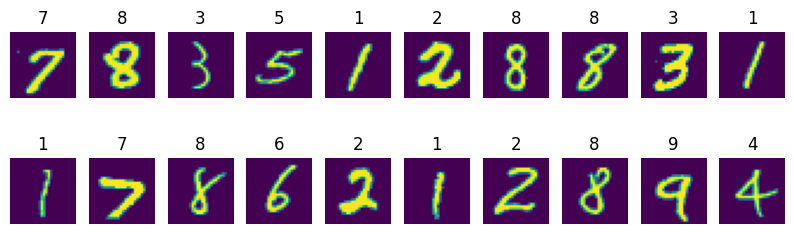

In [17]:
# Visualize Train Sample
for img,labels in train_loader:
  fig, (axs) = plt.subplots(2, 10, figsize=(10,3))
  for i in range(10):
    for j in range(2):
      axs[j,i].imshow(img[i+j*10,0])
      axs[j,i].set_title(labels[i+j*10].item())
      axs[j,i].axis('off')
  break

In [19]:
# test sample

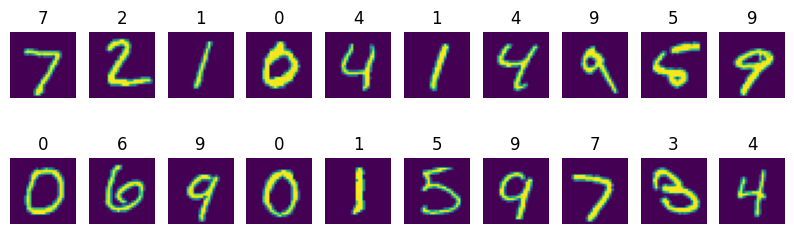

In [19]:
# Visualize Test Sample
for img,labels in test_loader:
  fig, (axs) = plt.subplots(2, 10, figsize=(10,3))
  for i in range(10):
    for j in range(2):
      axs[j,i].imshow(img[i+j*10,0])
      axs[j,i].set_title(labels[i+j*10].item())
      axs[j,i].axis('off')
  break

In [17]:
for img, labels in test_loader:
    print(labels)
    break

tensor([7, 2, 1, 0, 4, 1, 4, 9, 5, 9, 0, 6, 9, 0, 1, 5, 9, 7, 3, 4, 9, 6, 6, 5,
        4, 0, 7, 4, 0, 1, 3, 1])


# Design your method
Design your own model and training process

In [17]:
# Weight save directory
vis_num = 4
save_dir = './ej/weights/train_per_sub_sep_discrim_optimal'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Batch size during training
bs = 32
mbs = 4

# Size of image size
img_height = 32
img_width = 32
img_size = 32
img_depth = 1

# length of latent vector
z_size = 784
# Channels of generator feature
gfc = 64
# Channels of discriminator feature
dfc = 64

# Number of training epochs
num_epochs = 10
# Learning rate for optimizing
lr = 0.0002
lr_g = 1e-4
# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
beta1_g = 0.35

# Real or Fake label
real_label = 0
fake_label = 1

# out of distribution index
ood_index = 0

# epsilon for subtracting perturbation
epsilon = 0.3

In [18]:
# basic building blocks: Convolutional layer and Upconvolution layer
def conv2d(params_list, batch_norm = True):
    channel_in, channel_out, kernel_size, stride, padding, activation = params_list
    layers = []
    if batch_norm:
        layers += [nn.Conv2d(channel_in, channel_out, kernel_size, stride, padding, bias=False),
                   nn.BatchNorm2d(channel_out)]
        nn.init.xavier_uniform_(layers[0].weight)
    else:
        layers += [nn.Conv2d(channel_in, channel_out, kernel_size, stride, padding, bias=False)]
        nn.init.xavier_uniform_(layers[0].weight)
        
    if activation == 'ReLU':
        layers += [nn.ReLU(inplace=True)]
    if activation == 'LeakyReLU':
        layers += [nn.LeakyReLU(0.2, inplace=True)]
    if activation == 'Tanh':
        layers += [nn.Tanh()]
    if activation == 'Sigmoid':
        layers += [nn.Sigmoid()]
        
    return nn.Sequential(*layers)
        
    
def upconv2d(params_list, batch_norm = True):
    channel_in, channel_out, kernel_size, stride, padding, activation = params_list
    layers = []
    if batch_norm:
        layers += [nn.ConvTranspose2d(channel_in, channel_out, kernel_size, stride, padding, bias=False),
                   nn.BatchNorm2d(channel_out)]
        nn.init.xavier_uniform_(layers[0].weight)
    else:
        layers += [nn.ConvTranspose2d(channel_in, channel_out, kernel_size, stride, padding, bias=False)]
        nn.init.xavier_uniform_(layers[0].weight)
        
    if activation == 'ReLU':
        layers += [nn.ReLU(inplace=True)]
    if activation == 'LeakyReLU':
        layers += [nn.LeakyReLU(0.2, inplace=True)]
    if activation == 'Tanh':
        layers += [nn.Tanh()]
    if activation == 'Sigmoid':
        layers += [nn.Sigmoid()]
        
    return nn.Sequential(*layers)

In [19]:
def sample_z(batch_size = bs, d_noise=784):
    return torch.randn(batch_size, d_noise, device=device)

In [20]:
def transpose(ndarray):
    return np.transpose(ndarray, [0,2,3,1])

In [21]:
print('CREATE MODEL CLASS: Generator')


# [input channels, output channels, kernel_size, strides, paddings, activation fuctions]
cfg_g = [[z_size, 256, (4, 4), (1, 1), (0, 0), 'LeakyReLU'], [256, 128, (4, 4), (1, 1), (0, 0), 'LeakyReLU'], 
 [128, 64, (4, 4), (2, 2), (1, 1), 'LeakyReLU'], [64, 1, (4, 4), (2, 2), (1, 1), 'Tanh']]


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # define upconvolution layers based on given configuration parameters
        self.upconv1 = upconv2d(cfg_g[0])
        self.upconv2 = upconv2d(cfg_g[1])
        self.upconv3 = upconv2d(cfg_g[2])
        self.upconv4 = upconv2d(cfg_g[3], False)
        # self.upconv5 = upconv2d(cfg_g[4], False)
        
    def forward(self, x):
        # reshape the input (latent vector z) to a computable size for upconvolution
        x = x.view(-1, z_size, 1, 1)
        # forward each upconvolution layers
        x = self.upconv1(x)
        x = self.upconv2(x)
        x = self.upconv3(x)
        x = self.upconv4(x)
        # x = self.upconv5(x)
        return x
        

CREATE MODEL CLASS: Generator


In [22]:
print('CREATE MODEL CLASS: Discriminator')


# [input channels, output channels, kernel_size, strides, paddings, activation fuctions]
cfg_d = [[1, 64, (4, 4), (2, 2), (1, 1), 'LeakyReLU'], [64, 128, (4, 4), (2, 2), (1, 1), 'LeakyReLU'], 
 [128, 256, (4, 4), (1, 1), (0, 0), 'LeakyReLU'], [256, 1, (4, 4), (1, 1), (0, 0), 'Sigmoid']]


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # define convolution layers based on given configuration parameters
        self.conv1 = conv2d(cfg_d[0], False)
        self.conv2 = conv2d(cfg_d[1])
        self.conv3 = conv2d(cfg_d[2])
        self.conv4 = conv2d(cfg_d[3], False)
        # self.conv5 = nn.Conv2d(1, 1, kernel_size=(4, 4))
        
    def forward(self, x):
        # forward each upconvolution layers
        # x = F.pad(x, (0, 1, 0, 1), mode='replicate')
        x = self.conv1(x)
        # x = F.pad(x, (0, 1, 0, 1), mode='replicate')
        x = self.conv2(x)
        # x = F.pad(x, (0, 1, 0, 1), mode='replicate')
        x = self.conv3(x)
        x = self.conv4(x)
        # x = self.conv5(x)
        x = x.squeeze()
        return x
        

CREATE MODEL CLASS: Discriminator


In [23]:
print('CREATE MODEL CLASS: Discriminator_M')


# [input channels, output channels, kernel_size, strides, paddings, activation fuctions]
cfg_d_M = [[1, 64, (4, 4), (2, 2), (1, 1), 'LeakyReLU'], [64, 64, (3, 3), (1, 1), (1, 1), 'LeakyReLU'], [64, 128, (4, 4), (2, 2), (1, 1), 'LeakyReLU'], 
 [128, 128, (3, 3), (1, 1), (1, 1), 'LeakyReLU'], [128, 256, (4, 4), (1, 1), (0, 0), 'LeakyReLU'],
  [256, 256, (3, 3), (1, 1), (1, 1), 'LeakyReLU'], [256, 1, (4, 4), (1, 1), (0, 0), 'Sigmoid']]


class Discriminator_M(nn.Module):
    def __init__(self):
        super(Discriminator_M, self).__init__()
        
        # define convolution layers based on given configuration parameters
        self.conv1 = conv2d(cfg_d_M[0], False)
        self.conv2 = conv2d(cfg_d_M[1])
        self.conv3 = conv2d(cfg_d_M[2])
        self.conv4 = conv2d(cfg_d_M[3])
        self.conv5 = conv2d(cfg_d_M[4])
        self.conv6 = conv2d(cfg_d_M[5])
        self.conv7 = conv2d(cfg_d_M[6], False)
        # self.conv5 = nn.Conv2d(1, 1, kernel_size=(4, 4))
        
    def forward(self, x):
        
        # forward each upconvolution layers
        # x = F.pad(x, (0, 1, 0, 1), mode='replicate')
        x = self.conv1(x)
        # x = F.pad(x, (0, 1, 0, 1), mode='replicate')
        x = self.conv2(x) + x
        # x = F.pad(x, (0, 1, 0, 1), mode='replicate')
        x = self.conv3(x)
        x = self.conv4(x) + x
        x = self.conv5(x)
        x = self.conv6(x) + x
        x = self.conv7(x)
        # x = self.conv5(x)
        return x
        

CREATE MODEL CLASS: Discriminator_M


In [24]:
# modified for perturbation calculation 
# discriminator output 범위: 0.008~0.012
# 최고성능: zero_acc: 96.9353, else_acc: 99.5853 -> train_per_sub_sep_discrim/it1000.pt

print('CREATE MODEL CLASS: EuiNet - Discriminator Residual CNN (DRC)')

class EuiNet(nn.Module):
    def __init__(self):
        super(EuiNet, self).__init__()
        self.discriminator = Discriminator_M()
        self.resnet18 = models.resnet18(pretrained=False)
        self.resnet18.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        self.resnet18.fc = nn.Identity()
        self.fc = nn.Linear(512, 9, bias=True)
        self.avgpool = nn.AvgPool2d(4)
        self.conv4 = nn.Conv2d(1, 1, kernel_size=(4, 4), bias=False)

    def forward(self, x):
        h = self.discriminator(x)
        h = h.squeeze()
        r = self.resnet18(x)
        r = self.fc(r)
        ha = h.view(-1).unsqueeze(dim=1)
        k = torch.zeros(r.size(0)).unsqueeze(dim=1).to(device)
        rdiv = torch.div(r, 1000)
        rs = torch.cat((k, r), dim=1)
        rs = nn.functional.softmax(rs, dim=1)
        ha = torch.mul(ha, 0.004)  # alpha = 0.004
        ha = torch.add(ha, 0.008)  # gamma = 0.008
        rdnha = torch.cat((ha, rdiv), dim=1)
        x = nn.functional.softmax(rdnha, dim=1)
        rdivs = nn.functional.softmax(rdiv, dim=1)
        return rs, h, x, rdnha, rdivs

CREATE MODEL CLASS: EuiNet - Discriminator Residual CNN (DRC)


In [25]:
model = EuiNet()
generator_prime = Generator()
discriminator = Discriminator()

model.to(device)
generator_prime.to(device)
discriminator.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Discriminator(
  (conv1): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv4): Sequential(
    (0): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): Sigmoid()
  )
)

In [27]:
len(train_dataset), len(test_dataset)

(54077, 10000)

In [28]:
print(len(train_loader))

1689


In [29]:
print(len(test_loader))

312


In [26]:
print('STEP 5: INSTANTIATE LOSS CLASS')

criterion = nn.BCELoss()

print('STEP 6: INSTANTIATE OPTIMIZER CLASS')

optimizer_prime = torch.optim.Adam(generator_prime.parameters(), lr=lr_g, betas=(beta1_g, 0.699))
optimizer_M = torch.optim.Adam(model.parameters(), lr=lr, betas=(beta1, 0.599))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr_g, betas=(beta1_g, 0.699))

STEP 5: INSTANTIATE LOSS CLASS
STEP 6: INSTANTIATE OPTIMIZER CLASS


In [27]:
class Meter:
    def __init__(self):
        self.list = []
    def update(self, item):
        self.list.append(item)
    def avg(self):
        return torch.tensor(self.list).mean() if len(self.list) else None

def compute_accuracy(logits, labels):
  pred = torch.argmax(logits, dim=1)
  zero_idx= ((labels==0).nonzero(as_tuple=True)[0])
  else_idx= ((labels!=0).nonzero(as_tuple=True)[0])

  if len(zero_idx) == 0:
    zero_acc = None
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  else:
    zero_acc = (pred[zero_idx] == labels[zero_idx]).type(torch.float).mean().item()*100
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  return zero_acc, else_acc

STEP 7: TRAIN THE MODEL
tensor(0.7105, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 1.0842e-02, -1.1311e-04, -1.4559e-04, -5.6415e-04, -6.7668e-04,
        -5.2768e-05, -5.3600e-04,  1.6773e-03, -2.7160e-04, -6.3613e-05],
       device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1010, 0.0999, 0.0999, 0.0998, 0.0998, 0.0999, 0.0998, 0.1001, 0.0999,
        0.0999], grad_fn=<SelectBackward0>)


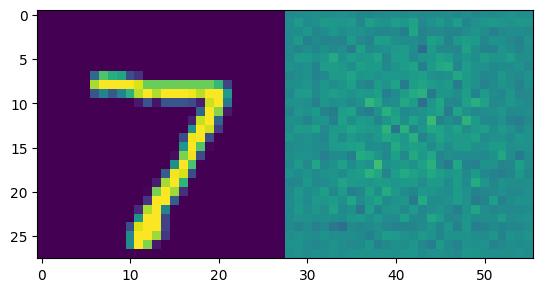

tensor(0.7407, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0110,  0.0005,  0.0012, -0.0002, -0.0009, -0.0001,  0.0005, -0.0005,
         0.0005, -0.0003], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1010, 0.0999, 0.1000, 0.0999, 0.0998, 0.0999, 0.0999, 0.0998, 0.0999,
        0.0999], grad_fn=<SelectBackward0>)


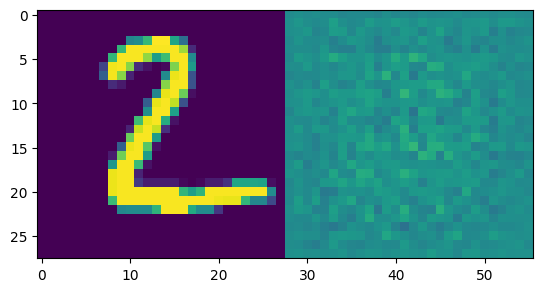

tensor(0.6811, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 1.0724e-02,  2.0648e-03,  8.2094e-04, -6.6376e-04, -7.5857e-04,
        -3.7988e-04, -2.4112e-05,  1.4716e-06,  2.1260e-04, -4.5651e-04],
       device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1010, 0.1001, 0.1000, 0.0998, 0.0998, 0.0998, 0.0999, 0.0999, 0.0999,
        0.0998], grad_fn=<SelectBackward0>)


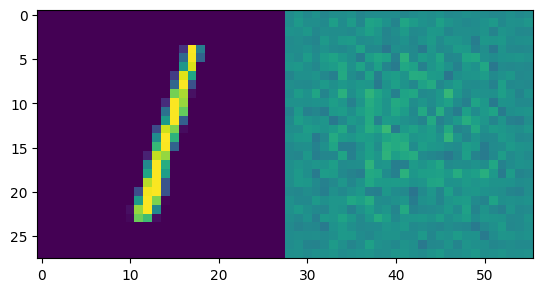

tensor(0.9648, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 1.1859e-02, -7.0979e-05,  4.7059e-05,  2.8894e-04, -2.8835e-04,
         4.4140e-05, -7.1530e-05,  5.3484e-05,  1.4251e-05, -7.2921e-05],
       device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1011, 0.0999, 0.0999, 0.0999, 0.0999, 0.0999, 0.0999, 0.0999, 0.0999,
        0.0999], grad_fn=<SelectBackward0>)


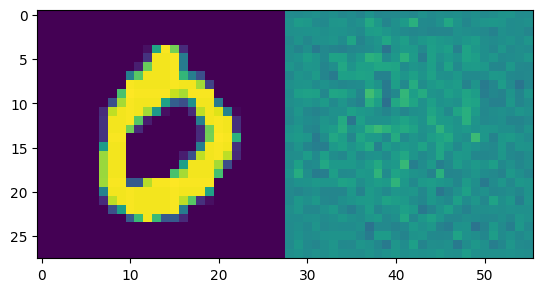

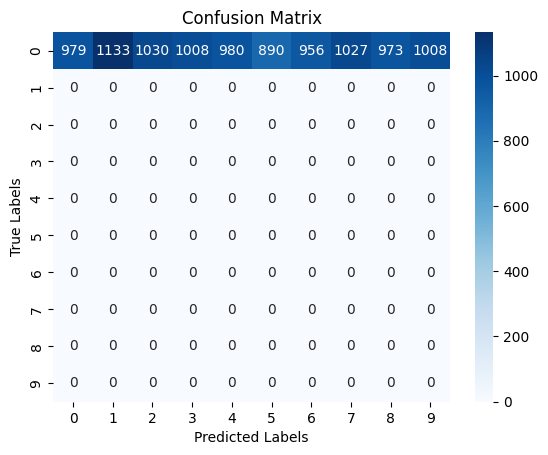

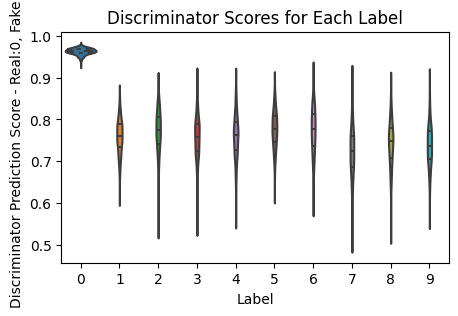

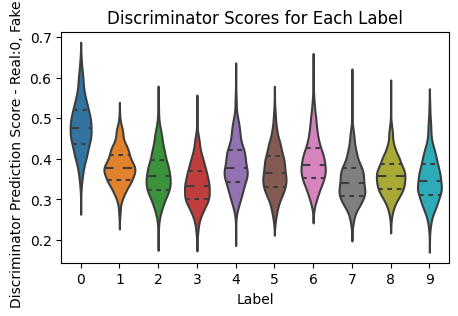

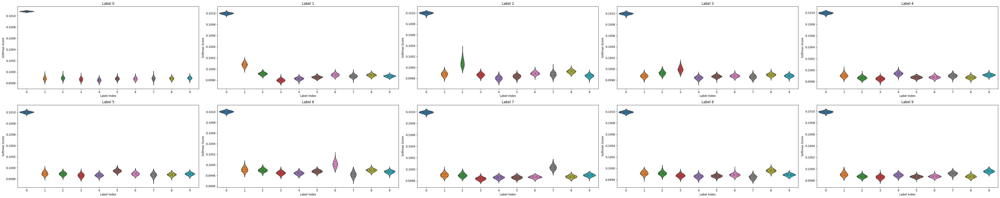

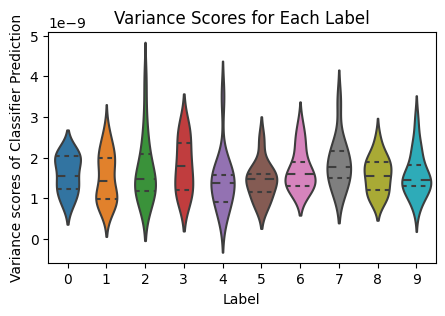

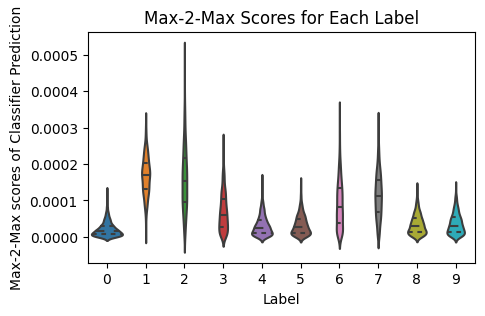

zero_acc: 100.0000, else_acc: 0.0000
it[100/16890] Loss_E:0.29476869106292725, Loss_DM:0.2491404116153717, Loss_R:0.04562827944755554, Loss_D:0.44437938928604126, Loss_G:3.5284667015075684
it[200/16890] Loss_E:0.03547091409564018, Loss_DM:7.206077134469524e-05, Loss_R:0.03539885332429549, Loss_D:0.07038886845111847, Loss_G:6.3949456214904785
it[300/16890] Loss_E:0.2971459925174713, Loss_DM:0.21425820887088776, Loss_R:0.08288778364658356, Loss_D:0.07452291995286942, Loss_G:4.117426872253418
it[400/16890] Loss_E:0.040303975343704224, Loss_DM:0.018965408205986023, Loss_R:0.0213385671377182, Loss_D:0.4599778354167938, Loss_G:3.032463788986206
it[500/16890] Loss_E:0.053675610572099686, Loss_DM:0.0398423857986927, Loss_R:0.013833224773406982, Loss_D:0.42359817028045654, Loss_G:3.606844663619995
tensor(0.9901, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0069, -0.0052, -0.0091, -0.0016, -0.0061, -0.0108,  0.0181,
        -0.0080, -0.0053], device='cuda:0', grad_fn=<SelectBa

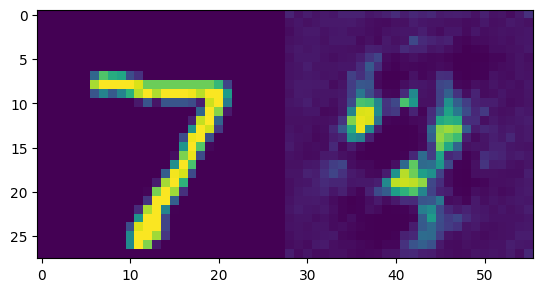

tensor(1.0000, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0056,  0.0156, -0.0084, -0.0077, -0.0091,  0.0007, -0.0080,
        -0.0028, -0.0113], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1015, 0.0997, 0.1018, 0.0994, 0.0995, 0.0993, 0.1003, 0.0994, 0.1000,
        0.0991], grad_fn=<SelectBackward0>)


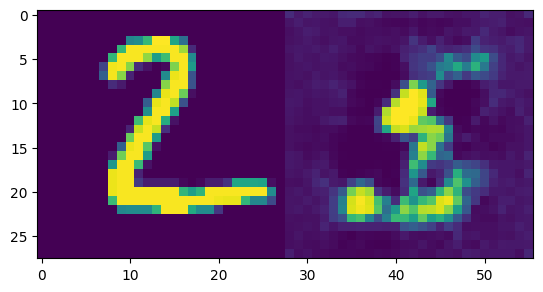

tensor(0.9996, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120,  0.0115, -0.0010, -0.0050, -0.0028, -0.0045, -0.0043, -0.0021,
        -0.0030, -0.0062], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1013, 0.1012, 0.0999, 0.0995, 0.0998, 0.0996, 0.0996, 0.0998, 0.0998,
        0.0994], grad_fn=<SelectBackward0>)


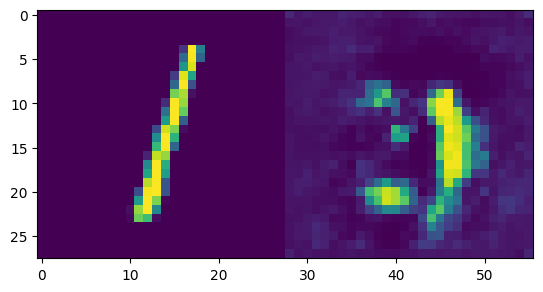

tensor(0.8394, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0114, -0.0089,  0.0097, -0.0093, -0.0050, -0.0070,  0.0098, -0.0102,
        -0.0038, -0.0076], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1014, 0.0993, 0.1012, 0.0993, 0.0997, 0.0995, 0.1012, 0.0992, 0.0998,
        0.0994], grad_fn=<SelectBackward0>)


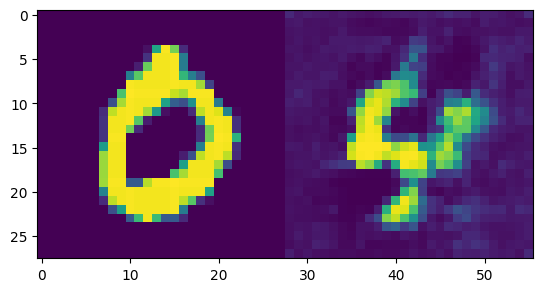

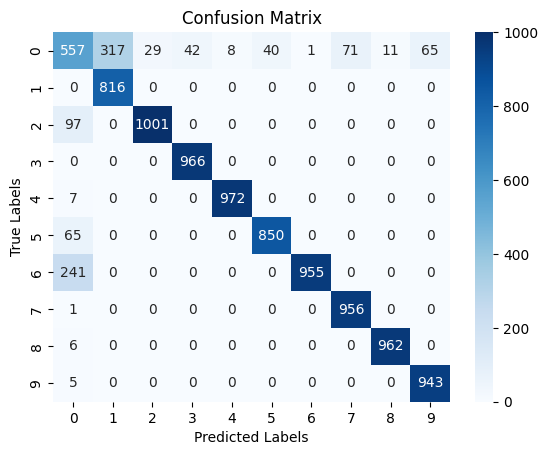

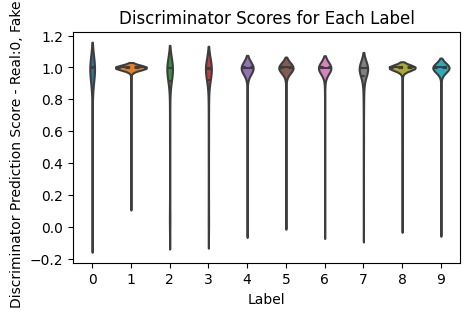

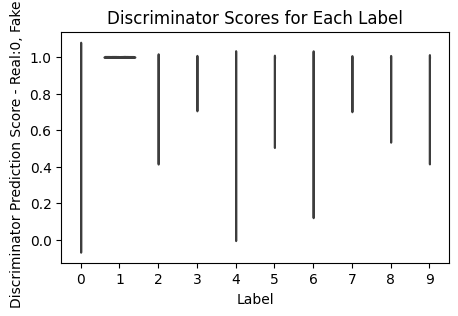

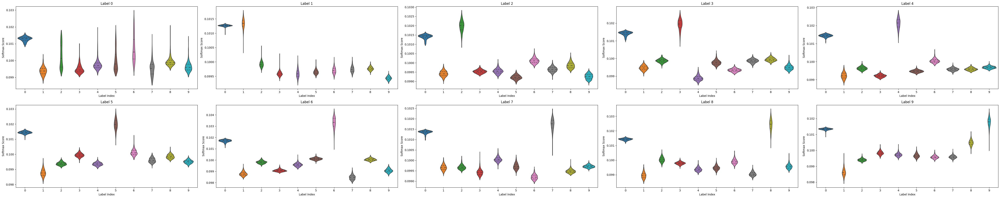

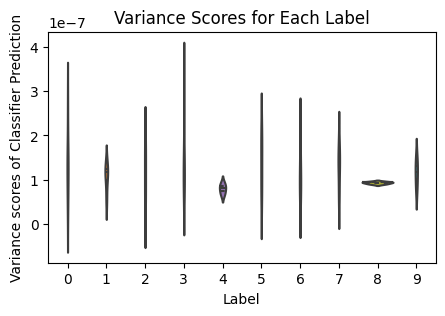

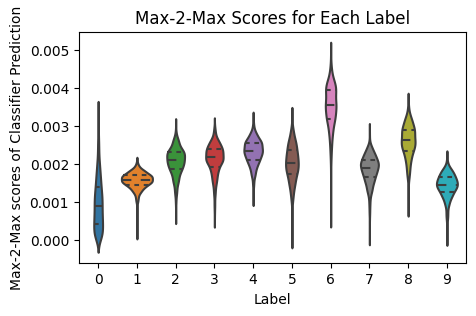

zero_acc: 56.6353, else_acc: 93.5054
it[600/16890] Loss_E:0.45811164379119873, Loss_DM:0.43761900067329407, Loss_R:0.020492643117904663, Loss_D:0.48458126187324524, Loss_G:1.870661735534668
it[700/16890] Loss_E:0.02833930216729641, Loss_DM:0.003119847271591425, Loss_R:0.025219454895704985, Loss_D:0.3606449067592621, Loss_G:4.064486503601074
it[800/16890] Loss_E:0.010139650665223598, Loss_DM:0.001724806847050786, Loss_R:0.008414843818172812, Loss_D:0.456703245639801, Loss_G:1.3319776058197021
it[900/16890] Loss_E:0.08348475396633148, Loss_DM:0.08085308223962784, Loss_R:0.002631671726703644, Loss_D:0.7159599661827087, Loss_G:3.989888906478882
it[1000/16890] Loss_E:0.6410952210426331, Loss_DM:0.5681299567222595, Loss_R:0.07296526432037354, Loss_D:0.21661227941513062, Loss_G:2.9085159301757812
tensor(0.0001, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0024, -0.0104, -0.0133, -0.0072, -0.0150, -0.0192,  0.0153,
        -0.0134, -0.0103], device='cuda:0', grad_fn=<SelectB

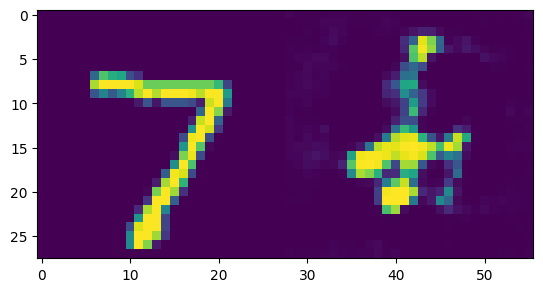

tensor(4.1703e-07, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0096,  0.0137, -0.0115, -0.0188, -0.0129, -0.0068, -0.0110,
        -0.0068, -0.0245], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1016, 0.0998, 0.1022, 0.0996, 0.0989, 0.0995, 0.1001, 0.0997, 0.1001,
        0.0984], grad_fn=<SelectBackward0>)


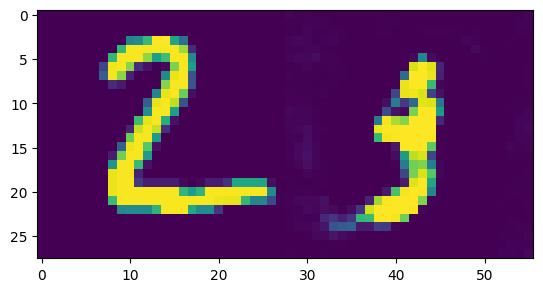

tensor(0.8851, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0115,  0.0127, -0.0027, -0.0133, -0.0090, -0.0118, -0.0056, -0.0103,
        -0.0043, -0.0159], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1017, 0.1018, 0.1002, 0.0992, 0.0996, 0.0993, 0.0999, 0.0995, 0.1001,
        0.0989], grad_fn=<SelectBackward0>)


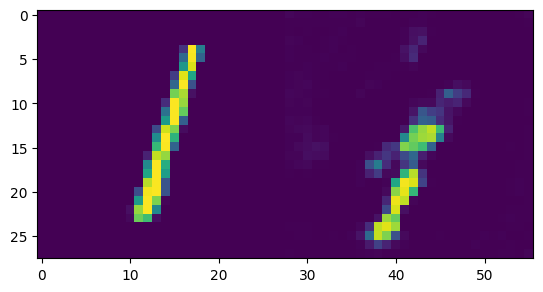

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0082, -0.0080, -0.0138, -0.0025, -0.0048,  0.0090, -0.0138,
        -0.0051, -0.0138], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1017, 0.0997, 0.0997, 0.0991, 0.1002, 0.1000, 0.1014, 0.0991, 0.1000,
        0.0991], grad_fn=<SelectBackward0>)


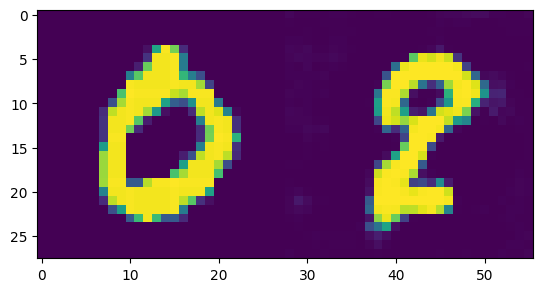

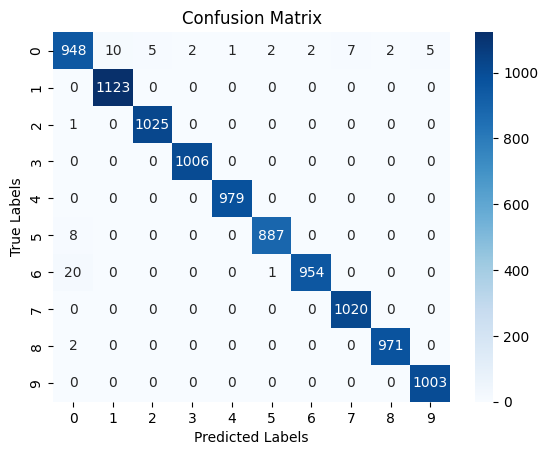

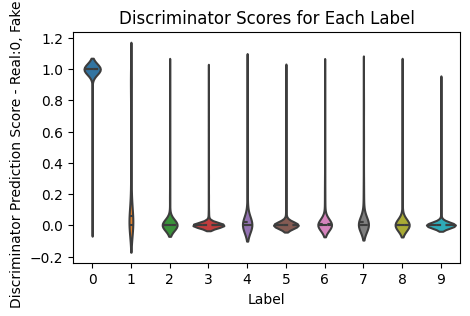

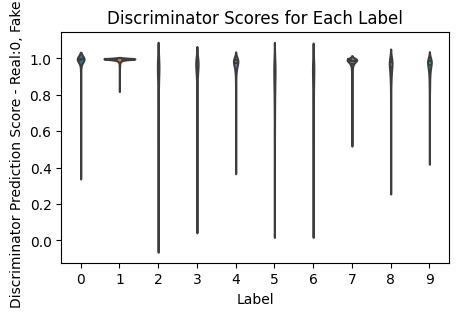

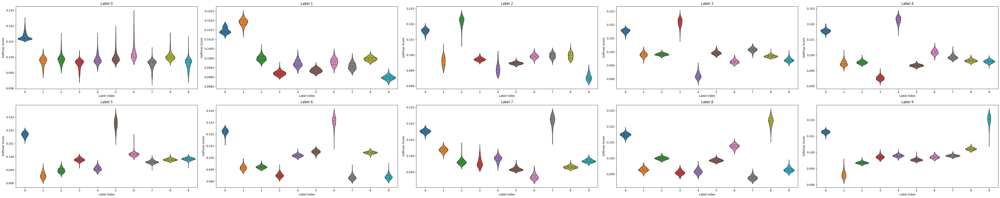

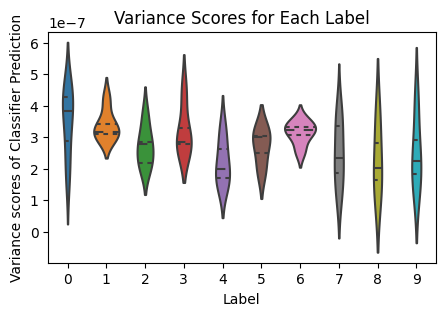

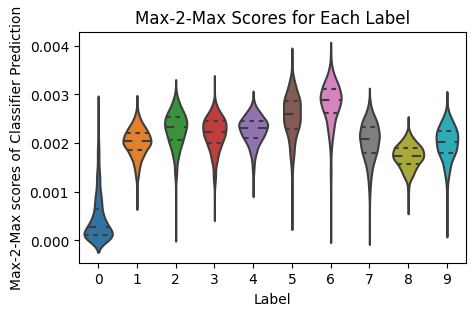

zero_acc: 96.9353, else_acc: 99.5853
it[1100/16890] Loss_E:0.07676901668310165, Loss_DM:0.0036275414749979973, Loss_R:0.07314147520810366, Loss_D:0.2891773581504822, Loss_G:4.629666805267334
it[1200/16890] Loss_E:0.015286775305867195, Loss_DM:0.004181277472525835, Loss_R:0.01110549783334136, Loss_D:0.15400370955467224, Loss_G:2.6891727447509766
it[1300/16890] Loss_E:0.01950846239924431, Loss_DM:0.0003166963579133153, Loss_R:0.019191766041330993, Loss_D:0.14472125470638275, Loss_G:3.4769465923309326
it[1400/16890] Loss_E:0.00578420190140605, Loss_DM:0.002444567857310176, Loss_R:0.003339634044095874, Loss_D:0.25339314341545105, Loss_G:3.2419841289520264
it[1500/16890] Loss_E:0.007669548504054546, Loss_DM:0.0002546438481658697, Loss_R:0.007414904655888677, Loss_D:0.17275726795196533, Loss_G:4.793994426727295
it[1600/16890] Loss_E:0.020800456404685974, Loss_DM:0.0002443463890813291, Loss_R:0.020556110015604645, Loss_D:0.1951061487197876, Loss_G:2.2277674674987793
it[1700/16890] Loss_E:0.00

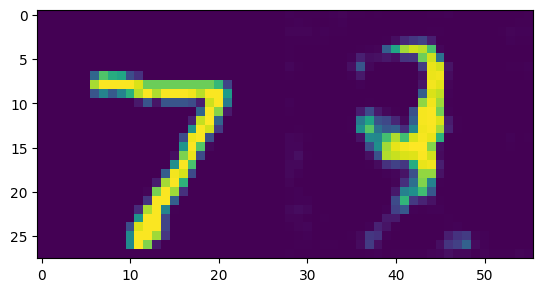

tensor(7.7768e-07, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0177,  0.0125, -0.0238, -0.0230, -0.0323, -0.0093, -0.0222,
        -0.0121, -0.0341], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1024, 0.0998, 0.1028, 0.0992, 0.0992, 0.0983, 0.1006, 0.0993, 0.1003,
        0.0981], grad_fn=<SelectBackward0>)


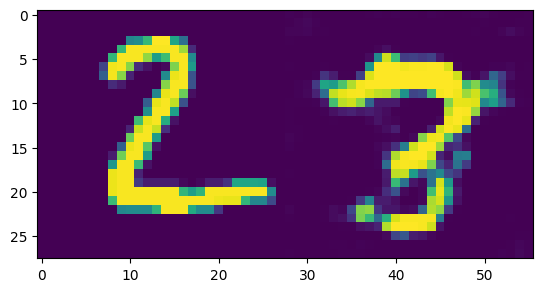

tensor(0.5062, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0100,  0.0081, -0.0058, -0.0145, -0.0045, -0.0133, -0.0072, -0.0085,
        -0.0031, -0.0123], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1015, 0.1013, 0.0999, 0.0991, 0.1001, 0.0992, 0.0998, 0.0997, 0.1002,
        0.0993], grad_fn=<SelectBackward0>)


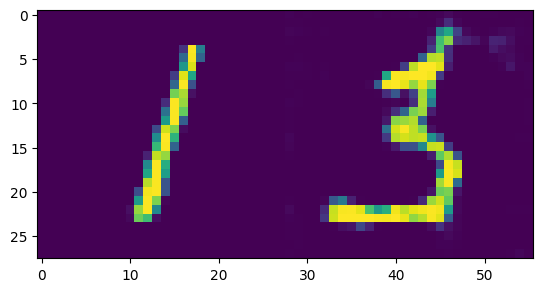

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0167, -0.0162, -0.0301, -0.0084, -0.0121,  0.0128, -0.0249,
        -0.0079, -0.0196], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1023, 0.0994, 0.0995, 0.0981, 0.1003, 0.0999, 0.1024, 0.0986, 0.1003,
        0.0991], grad_fn=<SelectBackward0>)


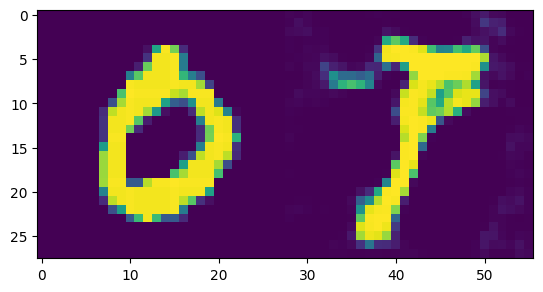

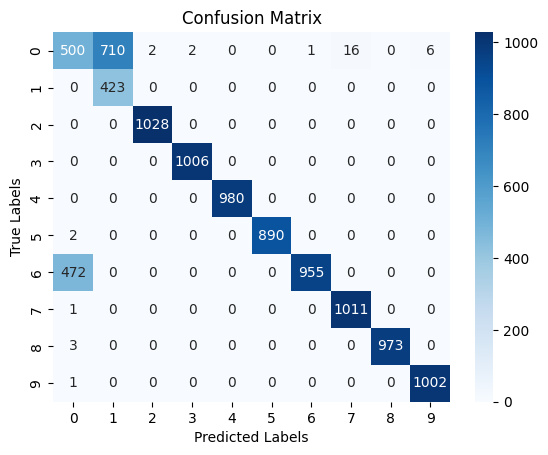

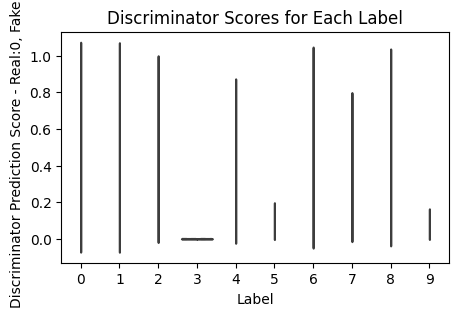

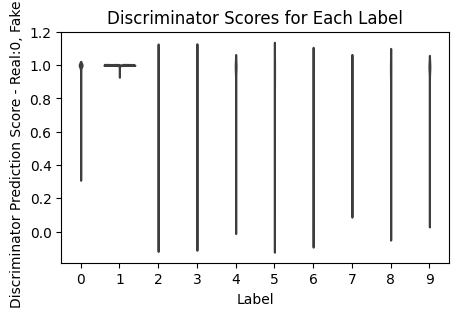

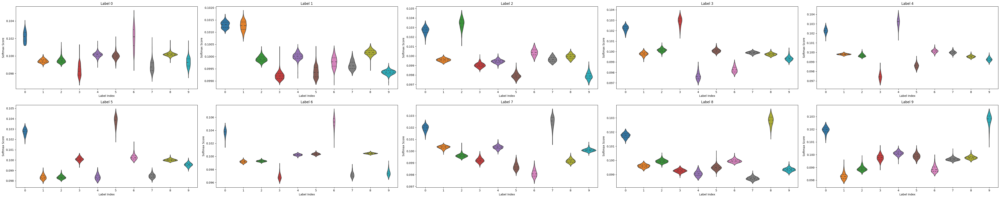

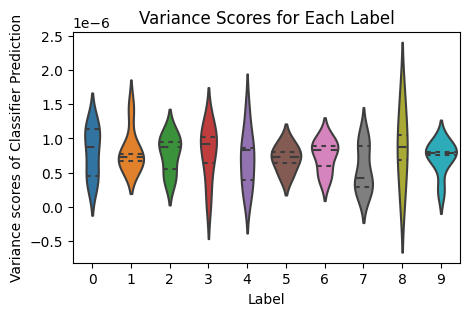

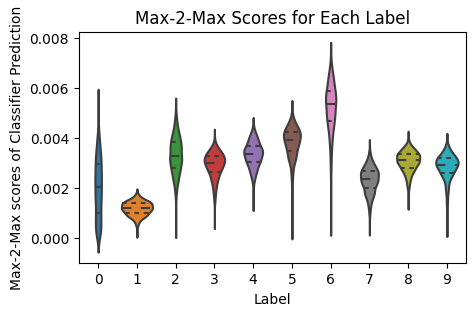

zero_acc: 49.7247, else_acc: 91.8425
it[2100/16890] Loss_E:0.011227943003177643, Loss_DM:7.18244154995773e-06, Loss_R:0.011220760561627685, Loss_D:0.11534297466278076, Loss_G:5.042155742645264
it[2200/16890] Loss_E:0.0017767157405614853, Loss_DM:1.8999653548235074e-05, Loss_R:0.0017577160870132502, Loss_D:0.06154699623584747, Loss_G:5.476518154144287
it[2300/16890] Loss_E:0.03126611188054085, Loss_DM:6.329578900476918e-05, Loss_R:0.03120281609153608, Loss_D:0.05557182431221008, Loss_G:5.332708358764648
it[2400/16890] Loss_E:0.008889829739928246, Loss_DM:3.589278639992699e-05, Loss_R:0.008853936953528319, Loss_D:0.36372342705726624, Loss_G:3.861994743347168
it[2500/16890] Loss_E:0.0036330344155430794, Loss_DM:0.0003124728100374341, Loss_R:0.0033205616055056453, Loss_D:0.04377812519669533, Loss_G:4.074711799621582
it[2600/16890] Loss_E:0.024258239194750786, Loss_DM:1.5013039046607446e-05, Loss_R:0.02424322615570418, Loss_D:0.08154736459255219, Loss_G:3.7089686393737793
it[2700/16890] Los

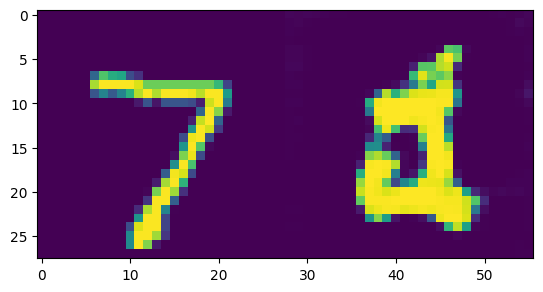

tensor(2.3144e-10, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0461,  0.0254, -0.0490, -0.0703, -0.0797, -0.0204, -0.0569,
        -0.0447, -0.0872], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1051, 0.0995, 0.1069, 0.0993, 0.0972, 0.0962, 0.1021, 0.0985, 0.0997,
        0.0955], grad_fn=<SelectBackward0>)


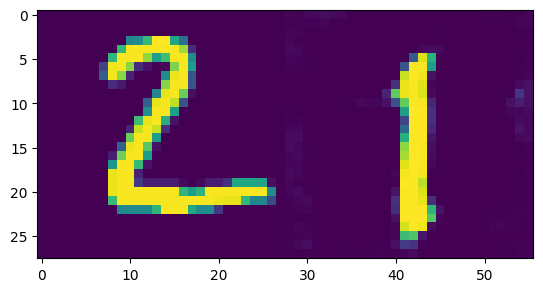

tensor(6.7470e-13, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080,  0.0119, -0.0070, -0.0198, -0.0077, -0.0208, -0.0175, -0.0058,
        -0.0133, -0.0181], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1017, 0.1021, 0.1002, 0.0989, 0.1001, 0.0988, 0.0992, 0.1003, 0.0996,
        0.0991], grad_fn=<SelectBackward0>)


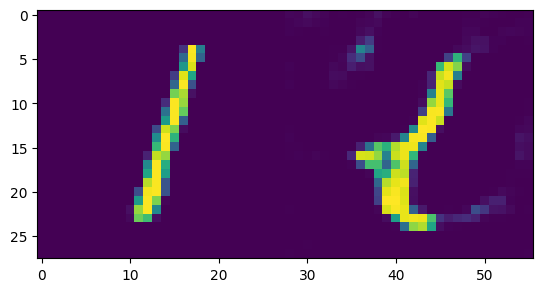

tensor(0.9997, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0118, -0.0023, -0.0251, -0.0133, -0.0161,  0.0086, -0.0265,
        -0.0057, -0.0245], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1023, 0.0999, 0.1008, 0.0985, 0.0997, 0.0994, 0.1019, 0.0984, 0.1005,
        0.0986], grad_fn=<SelectBackward0>)


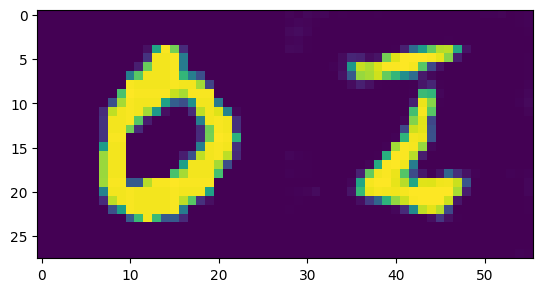

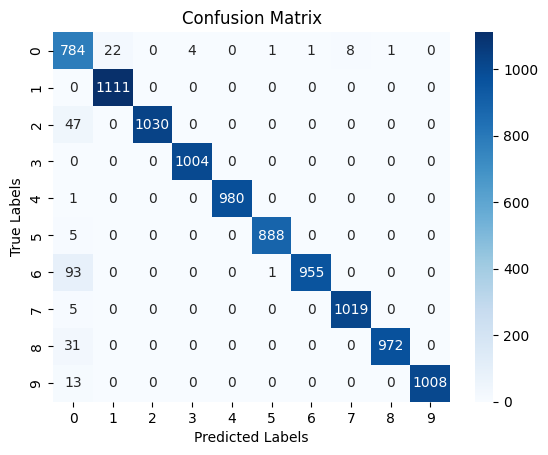

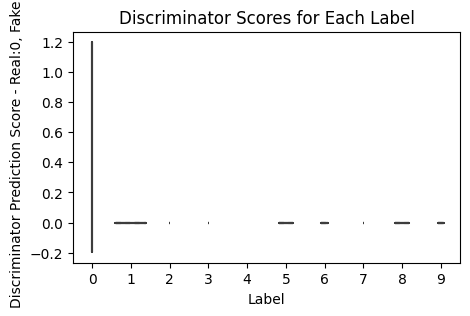

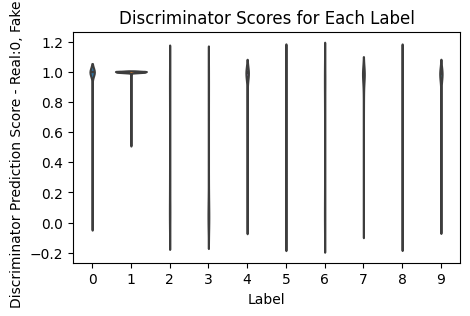

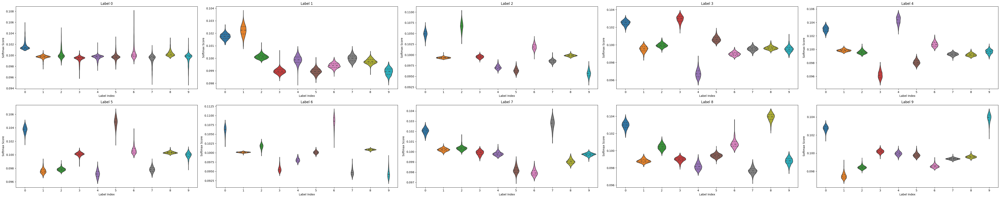

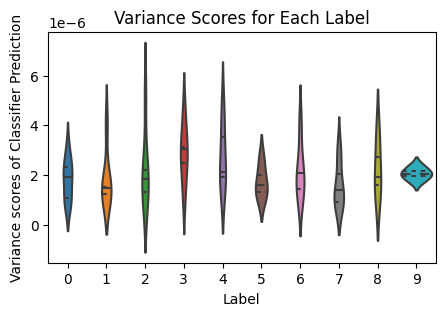

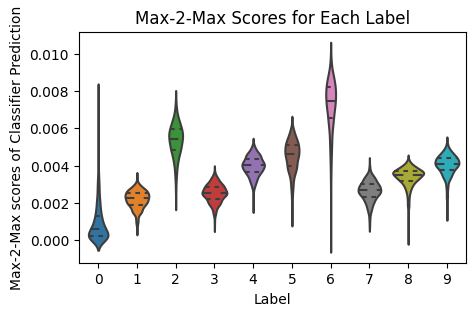

zero_acc: 81.0287, else_acc: 99.5768
it[3100/16890] Loss_E:0.00015505769988521934, Loss_DM:6.490413943538442e-05, Loss_R:9.015356044983491e-05, Loss_D:0.3132924735546112, Loss_G:3.39269757270813
it[3200/16890] Loss_E:0.00018342852126806974, Loss_DM:0.00010888124234043062, Loss_R:7.454727892763913e-05, Loss_D:0.026923861354589462, Loss_G:6.432888984680176
it[3300/16890] Loss_E:0.00038447187398560345, Loss_DM:8.563456503907219e-07, Loss_R:0.00038361552833521273, Loss_D:0.04248896241188049, Loss_G:4.430819988250732
it[3400/16890] Loss_E:0.0008300698245875537, Loss_DM:0.0005411297315731645, Loss_R:0.0002889400930143893, Loss_D:0.26759064197540283, Loss_G:3.968008041381836
it[3500/16890] Loss_E:0.0018032972002401948, Loss_DM:0.0017110612243413925, Loss_R:9.223597589880228e-05, Loss_D:0.01818399876356125, Loss_G:6.457004547119141
it[3600/16890] Loss_E:0.47551754117012024, Loss_DM:0.41361182928085327, Loss_R:0.06190571188926697, Loss_D:0.36445853114128113, Loss_G:4.521975517272949
it[3700/168

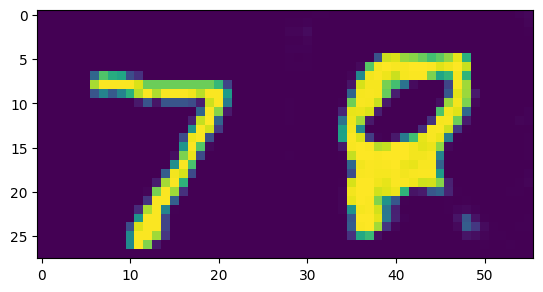

tensor(2.8111e-07, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0557,  0.0191, -0.0634, -0.0811, -0.1041, -0.0269, -0.0553,
        -0.0537, -0.0971], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1060, 0.0995, 0.1072, 0.0987, 0.0970, 0.0948, 0.1024, 0.0995, 0.0997,
        0.0954], grad_fn=<SelectBackward0>)


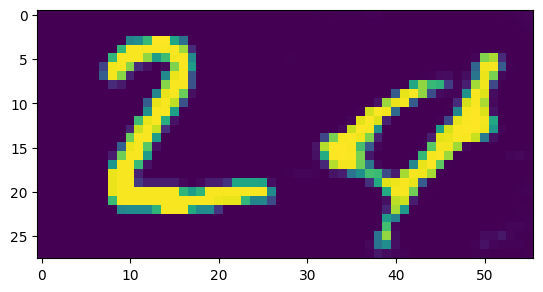

tensor(6.7456e-05, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080,  0.0121, -0.0064, -0.0242, -0.0059, -0.0273, -0.0172, -0.0042,
        -0.0198, -0.0240], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1019, 0.1023, 0.1004, 0.0987, 0.1005, 0.0984, 0.0994, 0.1007, 0.0991,
        0.0987], grad_fn=<SelectBackward0>)


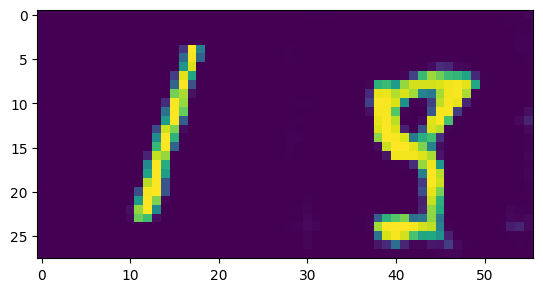

tensor(3.1953e-07, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0443, -0.0219, -0.0829, -0.0462, -0.0543,  0.0218, -0.0771,
        -0.0382, -0.0775], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1050, 0.0996, 0.1019, 0.0959, 0.0995, 0.0986, 0.1064, 0.0964, 0.1002,
        0.0964], grad_fn=<SelectBackward0>)


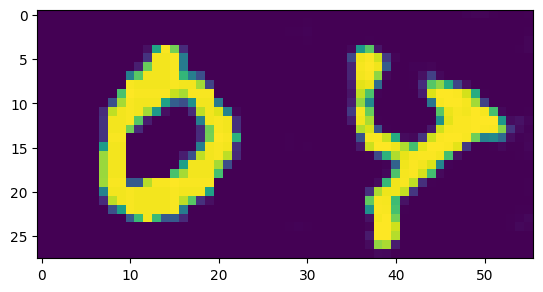

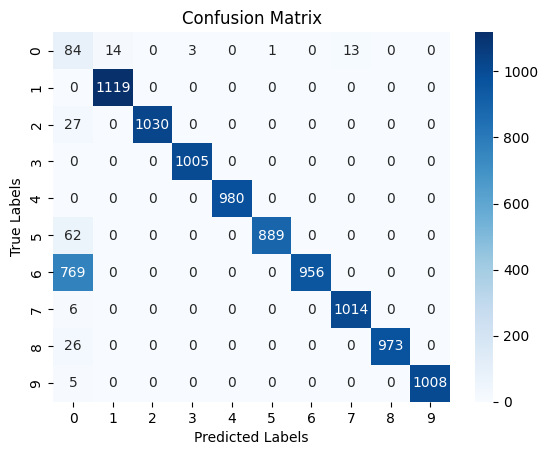

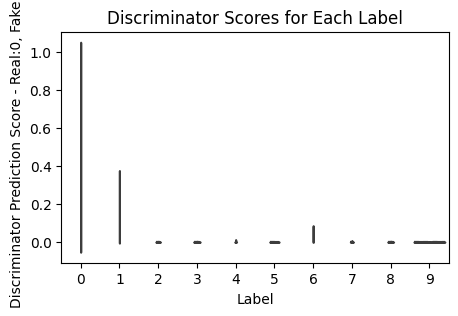

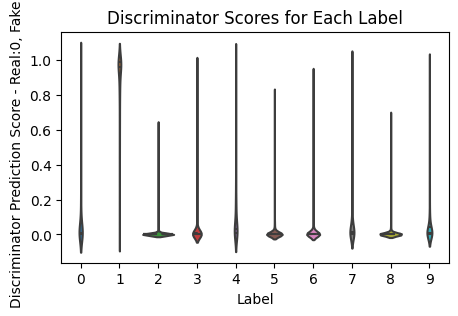

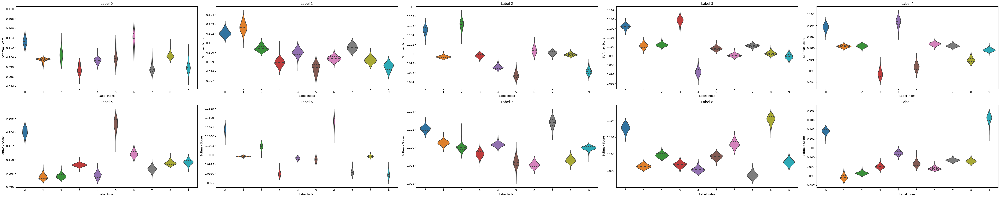

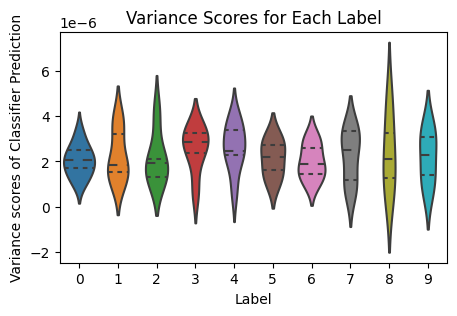

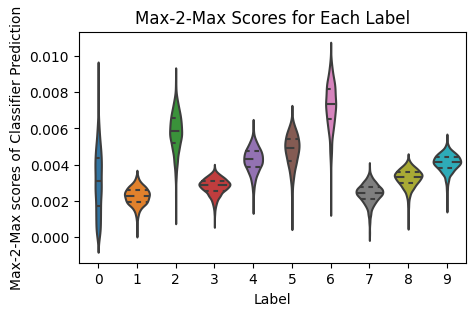

zero_acc: 8.3842, else_acc: 99.6589
it[4100/16890] Loss_E:0.0009903176687657833, Loss_DM:0.0008887614239938557, Loss_R:0.0001015562447719276, Loss_D:0.023719366639852524, Loss_G:5.92125129699707
it[4200/16890] Loss_E:0.0007469503907486796, Loss_DM:0.00023432302987203002, Loss_R:0.0005126273608766496, Loss_D:0.017672207206487656, Loss_G:5.553679466247559
it[4300/16890] Loss_E:0.011046229861676693, Loss_DM:4.142526813666336e-05, Loss_R:0.01100480459354003, Loss_D:0.05368860438466072, Loss_G:7.02498197555542
it[4400/16890] Loss_E:0.00026103496202267706, Loss_DM:5.928313112235628e-05, Loss_R:0.00020175183090032078, Loss_D:0.1856044977903366, Loss_G:5.691269874572754
it[4500/16890] Loss_E:0.06798170506954193, Loss_DM:5.604200055131514e-07, Loss_R:0.06798114464953642, Loss_D:0.02289450541138649, Loss_G:5.402005672454834
it[4600/16890] Loss_E:0.10683709383010864, Loss_DM:0.05296654254198074, Loss_R:0.0538705512881279, Loss_D:0.011914758011698723, Loss_G:5.262480735778809
it[4700/16890] Loss_E

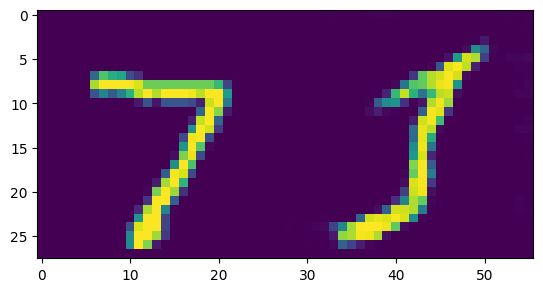

tensor(0.0001, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0459,  0.0187, -0.0812, -0.0755, -0.1241, -0.0080, -0.0936,
        -0.0560, -0.1233], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1067, 0.1011, 0.1079, 0.0976, 0.0982, 0.0935, 0.1050, 0.0964, 0.1001,
        0.0936], grad_fn=<SelectBackward0>)


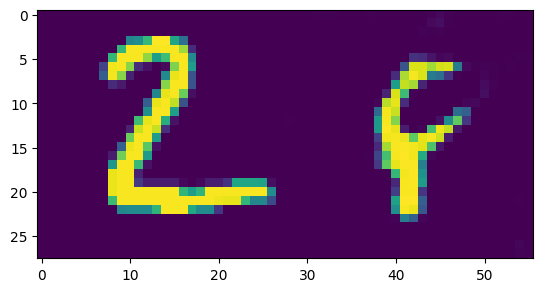

tensor(0.0030, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080,  0.0127,  0.0013, -0.0313, -0.0117, -0.0413, -0.0101, -0.0149,
        -0.0202, -0.0391], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1023, 0.1028, 0.1016, 0.0983, 0.1003, 0.0974, 0.1004, 0.1000, 0.0994,
        0.0976], grad_fn=<SelectBackward0>)


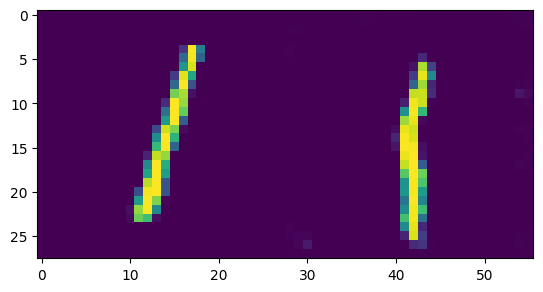

tensor(1.0000, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0098, -0.0035, -0.0111, -0.0070,  0.0037,  0.0050, -0.0112,
        -0.0034, -0.0070], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1015, 0.0993, 0.1000, 0.0992, 0.0996, 0.1007, 0.1008, 0.0992, 0.1000,
        0.0996], grad_fn=<SelectBackward0>)


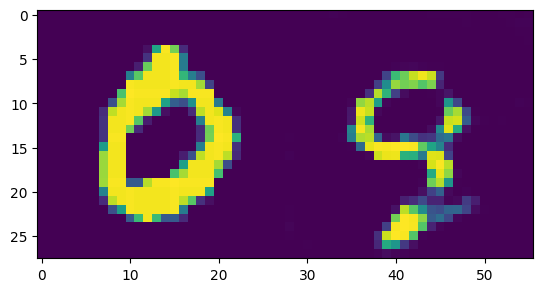

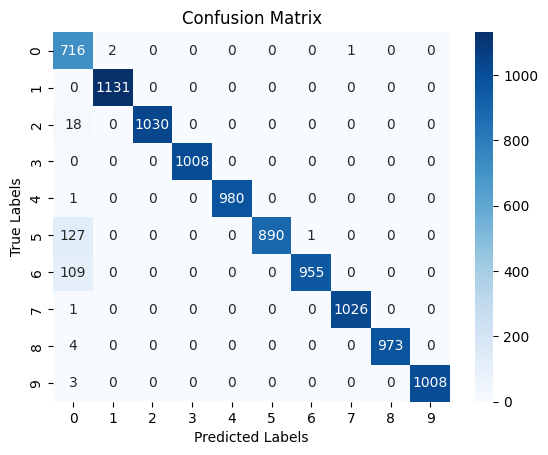

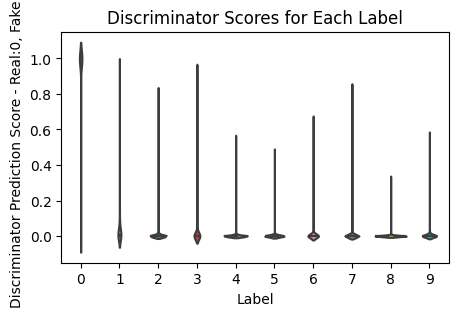

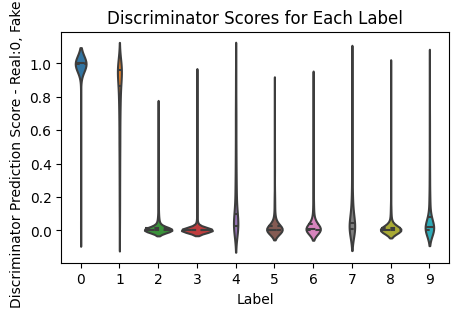

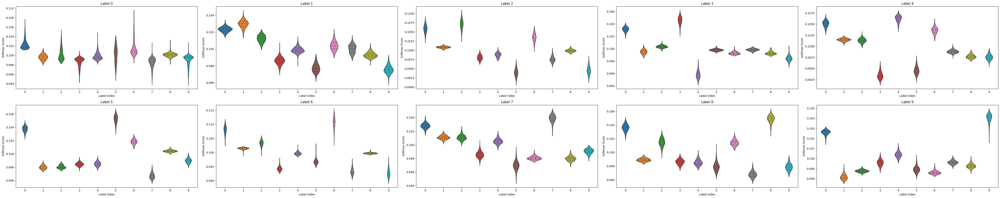

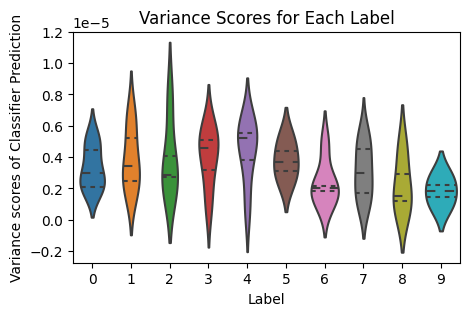

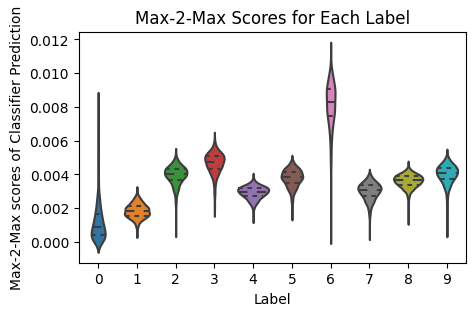

zero_acc: 73.1489, else_acc: 99.9554
it[5100/16890] Loss_E:0.021456025540828705, Loss_DM:4.101285924207332e-07, Loss_R:0.021455615412236284, Loss_D:0.026431269943714142, Loss_G:4.883985996246338
it[5200/16890] Loss_E:0.0005127912736497819, Loss_DM:5.96749373471539e-07, Loss_R:0.0005121945242763104, Loss_D:0.24788710474967957, Loss_G:6.533196449279785
it[5300/16890] Loss_E:1.9445848010946065e-05, Loss_DM:6.02965519647114e-06, Loss_R:1.3416192814474925e-05, Loss_D:0.020396605134010315, Loss_G:4.2688164710998535
it[5400/16890] Loss_E:2.184948205947876, Loss_DM:2.1842093467712402, Loss_R:0.0007388591766357422, Loss_D:0.02493155747652054, Loss_G:5.3944244384765625
it[5500/16890] Loss_E:0.00034976517781615257, Loss_DM:9.079388973987079e-07, Loss_R:0.00034885723891875386, Loss_D:0.03410787135362625, Loss_G:4.4870123863220215
it[5600/16890] Loss_E:0.00023738166783005, Loss_DM:1.0298540473741014e-06, Loss_R:0.0002363518137826759, Loss_D:0.017689108848571777, Loss_G:4.682342052459717
it[5700/168

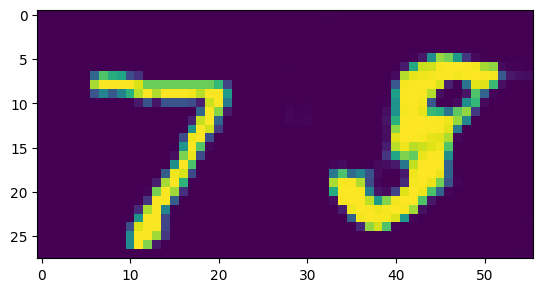

tensor(0.9941, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0359,  0.0172, -0.1065, -0.0451, -0.1301, -0.0113, -0.0875,
        -0.0772, -0.1217], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1072, 0.1022, 0.1077, 0.0952, 0.1012, 0.0930, 0.1047, 0.0970, 0.0980,
        0.0938], grad_fn=<SelectBackward0>)


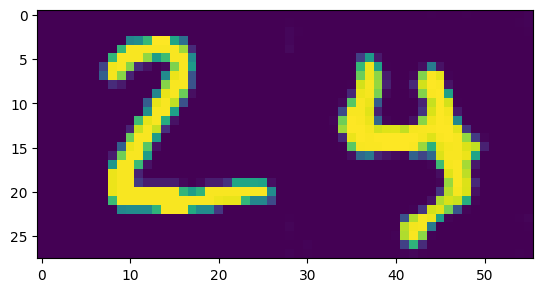

tensor(0.9871, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0119,  0.0139, -0.0084, -0.0386, -0.0018, -0.0339, -0.0072, -0.0224,
        -0.0181, -0.0370], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1026, 0.1028, 0.1006, 0.0976, 0.1012, 0.0980, 0.1007, 0.0992, 0.0996,
        0.0977], grad_fn=<SelectBackward0>)


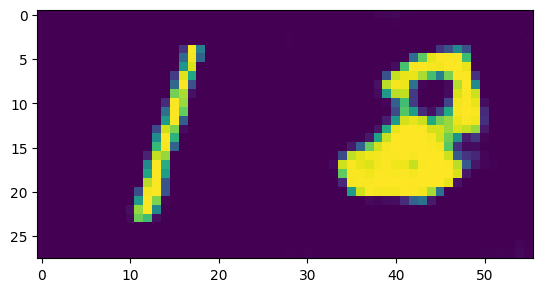

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0251, -0.0178, -0.1125, -0.0207, -0.0814,  0.0257, -0.0882,
        -0.0598, -0.0928], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1059, 0.1020, 0.1028, 0.0935, 0.1025, 0.0964, 0.1073, 0.0958, 0.0985,
        0.0953], grad_fn=<SelectBackward0>)


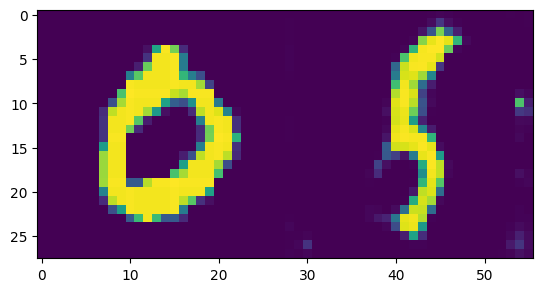

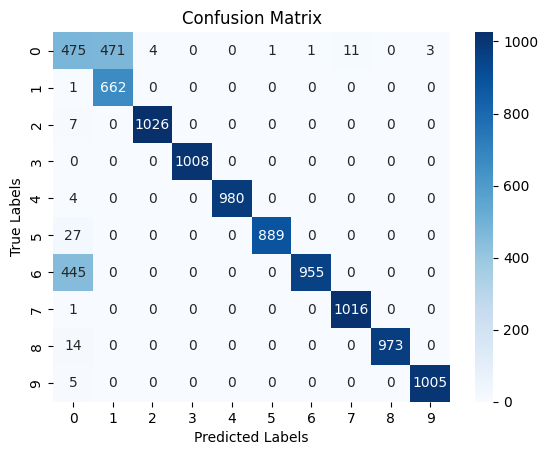

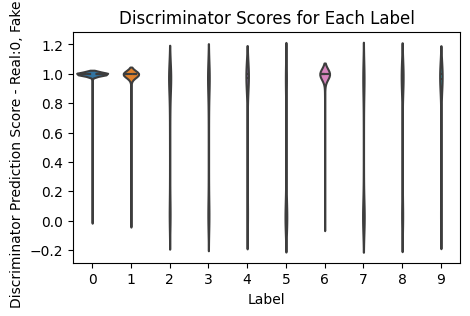

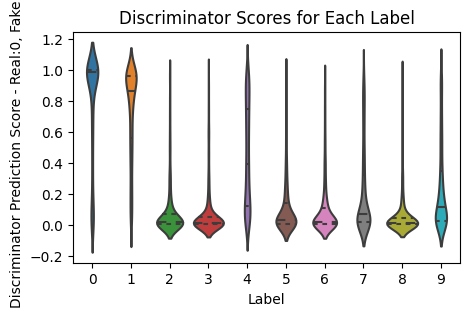

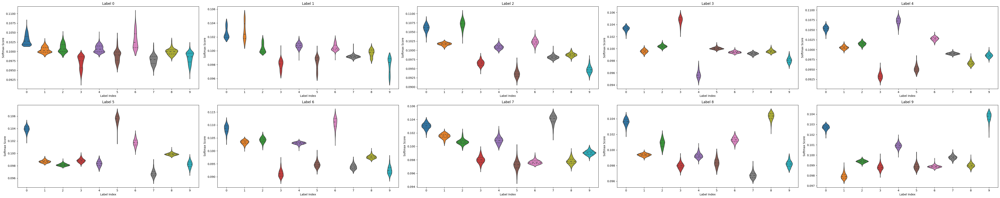

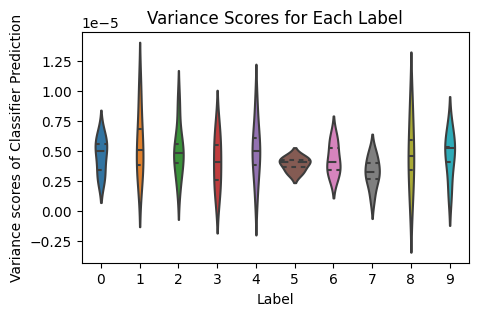

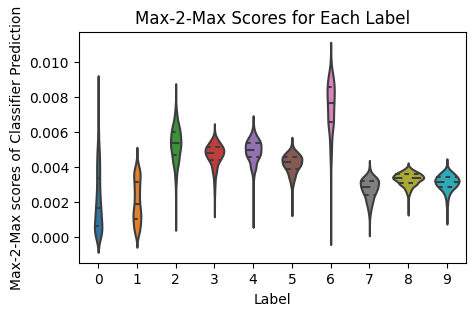

zero_acc: 48.7837, else_acc: 94.5613
it[6100/16890] Loss_E:5.3221235275268555, Loss_DM:5.322099685668945, Loss_R:2.384185791015625e-05, Loss_D:0.6430864930152893, Loss_G:6.83832311630249
it[6200/16890] Loss_E:1.7681694030761719, Loss_DM:1.7675273418426514, Loss_R:0.0006420612335205078, Loss_D:0.19037187099456787, Loss_G:6.622795581817627
it[6300/16890] Loss_E:0.00014863547403365374, Loss_DM:5.955054120931891e-07, Loss_R:0.00014803996862156055, Loss_D:0.026504820212721825, Loss_G:6.332020282745361
it[6400/16890] Loss_E:0.030105218291282654, Loss_DM:0.005357984919101, Loss_R:0.024747233372181654, Loss_D:0.38457804918289185, Loss_G:6.771018028259277
it[6500/16890] Loss_E:0.016743099316954613, Loss_DM:3.700342077195273e-08, Loss_R:0.01674306231353384, Loss_D:0.04662085697054863, Loss_G:8.735406875610352
it[6600/16890] Loss_E:0.02404826320707798, Loss_DM:9.899558506276662e-09, Loss_R:0.024048253307519474, Loss_D:0.056907664984464645, Loss_G:8.112632751464844
it[6700/16890] Loss_E:0.06557052

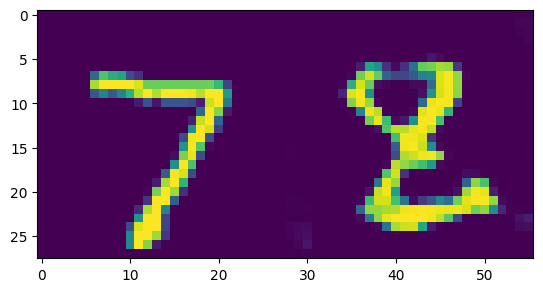

tensor(1.9589e-09, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0285,  0.0142, -0.0686, -0.0367, -0.0875, -0.0132, -0.0636,
        -0.0340, -0.0876], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1048, 0.1011, 0.1055, 0.0971, 0.1002, 0.0953, 0.1026, 0.0976, 0.1005,
        0.0953], grad_fn=<SelectBackward0>)


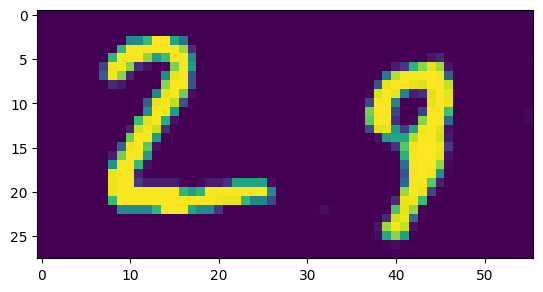

tensor(5.3847e-12, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080,  0.0150, -0.0075, -0.0364, -0.0059, -0.0303, -0.0048, -0.0233,
        -0.0141, -0.0398], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1022, 0.1029, 0.1006, 0.0978, 0.1008, 0.0984, 0.1009, 0.0990, 0.1000,
        0.0974], grad_fn=<SelectBackward0>)


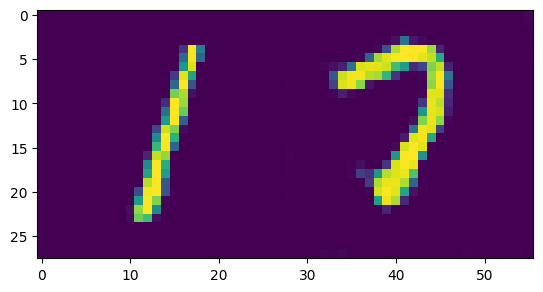

tensor(0.0017, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0193, -0.0225, -0.1043, -0.0258, -0.0784,  0.0214, -0.0811,
        -0.0477, -0.0912], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1053, 0.1024, 0.1021, 0.0941, 0.1018, 0.0965, 0.1067, 0.0963, 0.0996,
        0.0953], grad_fn=<SelectBackward0>)


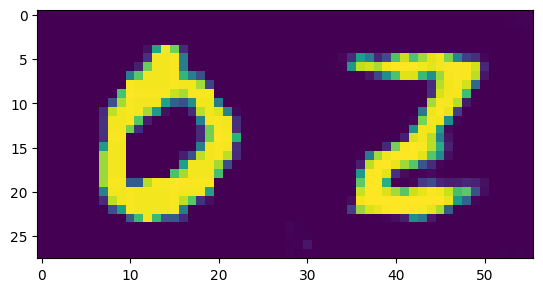

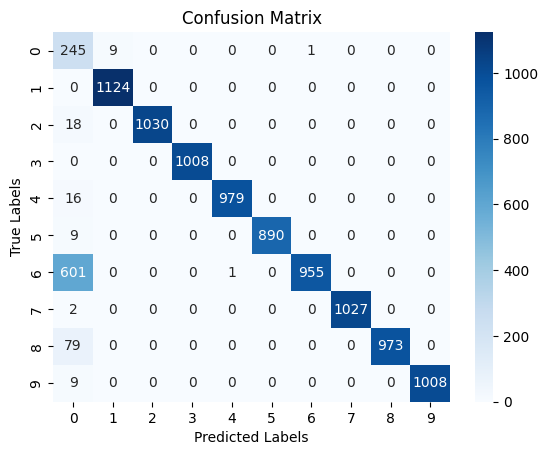

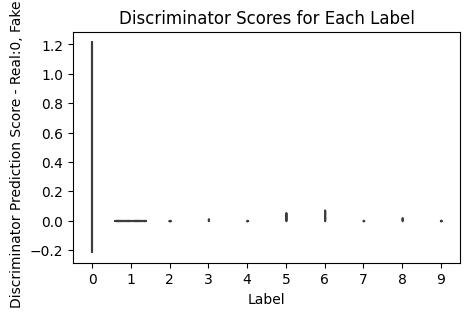

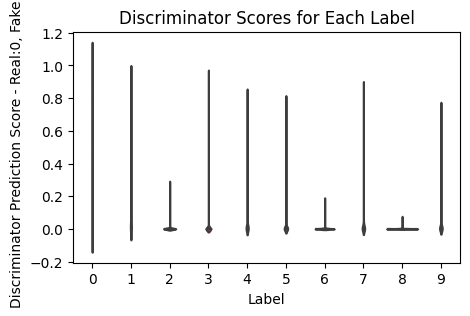

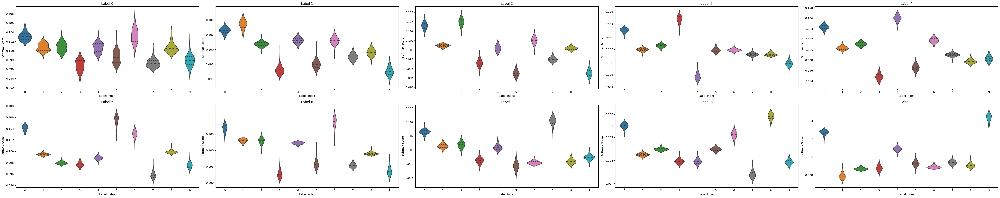

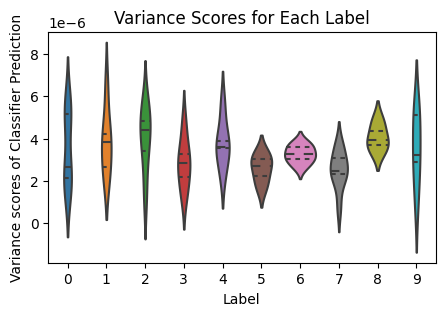

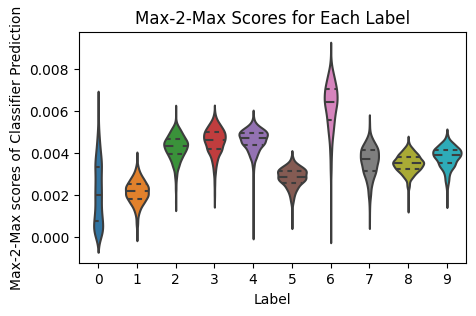

zero_acc: 24.4087, else_acc: 99.8800
it[7100/16890] Loss_E:0.0055672284215688705, Loss_DM:0.00015973324480000883, Loss_R:0.005407495176768862, Loss_D:0.02036885730922222, Loss_G:5.508832931518555
it[7200/16890] Loss_E:2.3802867872291245e-06, Loss_DM:7.379782118732692e-07, Loss_R:1.6423085753558553e-06, Loss_D:0.02005440555512905, Loss_G:8.050403594970703
it[7300/16890] Loss_E:0.0006074170814827085, Loss_DM:4.900326757706353e-07, Loss_R:0.0006069270488069378, Loss_D:0.1565009504556656, Loss_G:4.535275459289551
it[7400/16890] Loss_E:0.007133838254958391, Loss_DM:2.707090970943682e-05, Loss_R:0.007106767345248954, Loss_D:0.041776277124881744, Loss_G:3.619147777557373
it[7500/16890] Loss_E:0.007359876297414303, Loss_DM:0.002192591316998005, Loss_R:0.005167284980416298, Loss_D:0.023723630234599113, Loss_G:6.283561706542969
it[7600/16890] Loss_E:0.00043429897050373256, Loss_DM:4.506743067622665e-08, Loss_R:0.00043425390307305634, Loss_D:0.030131608247756958, Loss_G:6.2523298263549805
it[7700

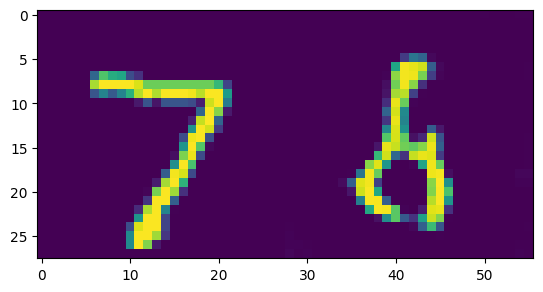

tensor(0.2123, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0088, -0.0552,  0.0203, -0.1079, -0.0673, -0.1359, -0.0156, -0.0944,
        -0.0632, -0.1352], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1075, 0.1008, 0.1087, 0.0956, 0.0996, 0.0930, 0.1049, 0.0969, 0.1000,
        0.0931], grad_fn=<SelectBackward0>)


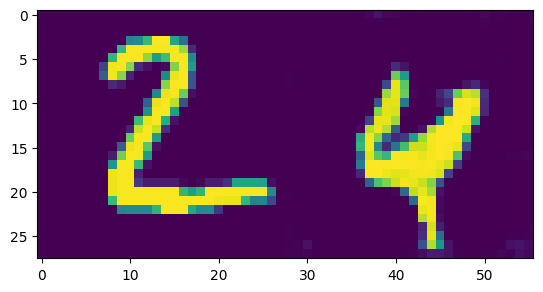

tensor(0.9612, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0118,  0.0126, -0.0091, -0.0386, -0.0097, -0.0314,  0.0041, -0.0327,
        -0.0105, -0.0439], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1027, 0.1028, 0.1005, 0.0976, 0.1005, 0.0983, 0.1019, 0.0982, 0.1004,
        0.0971], grad_fn=<SelectBackward0>)


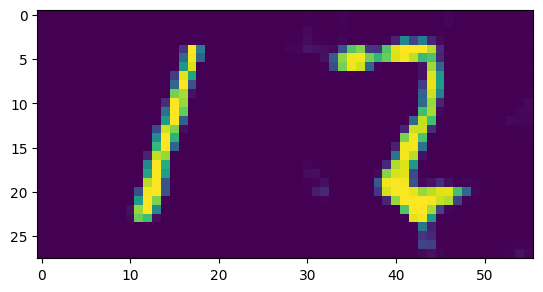

tensor(0.9988, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0456, -0.0061, -0.1487, -0.0462, -0.1492,  0.0207, -0.1138,
        -0.0744, -0.1423], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1083, 0.1022, 0.1063, 0.0922, 0.1021, 0.0921, 0.1092, 0.0955, 0.0993,
        0.0928], grad_fn=<SelectBackward0>)


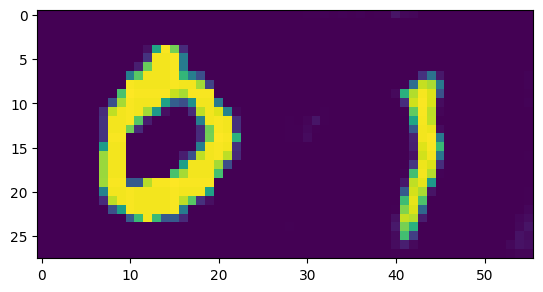

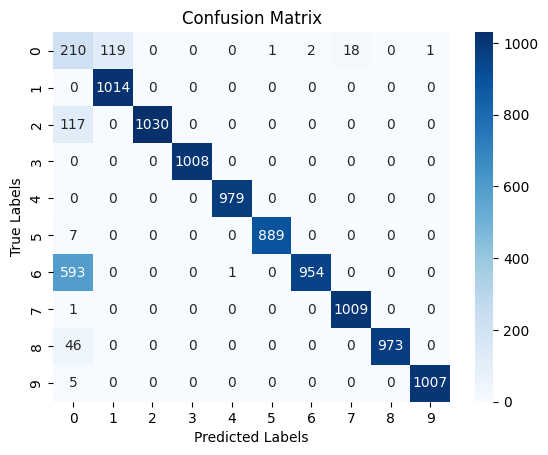

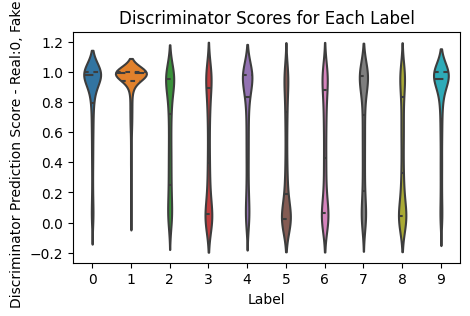

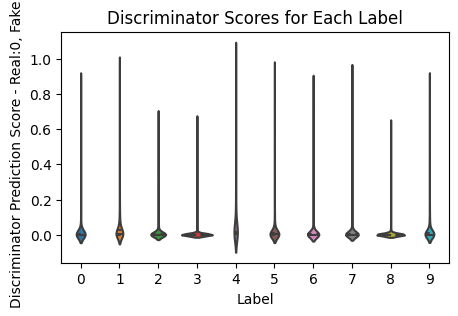

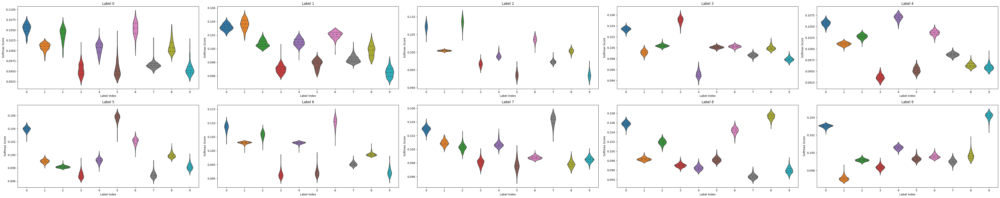

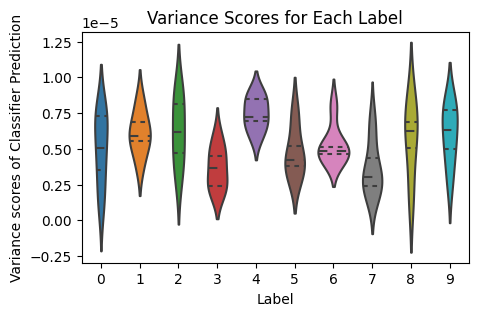

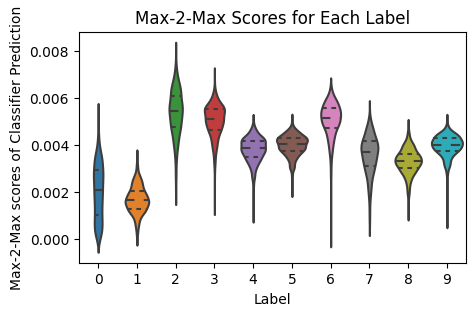

zero_acc: 21.8562, else_acc: 98.4374
it[8100/16890] Loss_E:7.172836194513366e-05, Loss_DM:3.484763965388993e-06, Loss_R:6.824359797974466e-05, Loss_D:0.024667436257004738, Loss_G:7.523993492126465
it[8200/16890] Loss_E:0.015589886344969273, Loss_DM:0.01539832353591919, Loss_R:0.00019156280905008316, Loss_D:0.09111714363098145, Loss_G:5.697307586669922
it[8300/16890] Loss_E:4.538122539088363e-06, Loss_DM:1.4137986781292966e-08, Loss_R:4.52398455230707e-06, Loss_D:0.02558223158121109, Loss_G:5.950757026672363
it[8400/16890] Loss_E:2.1858928448637016e-05, Loss_DM:4.470370740250473e-08, Loss_R:2.181422474123451e-05, Loss_D:0.02484731748700142, Loss_G:3.244924306869507
it[8500/16890] Loss_E:0.021963169798254967, Loss_DM:9.352503660409184e-09, Loss_R:0.021963160445751306, Loss_D:0.006212213076651096, Loss_G:5.651403427124023
it[8600/16890] Loss_E:7.876298695919104e-06, Loss_DM:1.5934768782255304e-10, Loss_R:7.876139348231281e-06, Loss_D:0.06056324020028114, Loss_G:6.11652946472168
it[8700/16

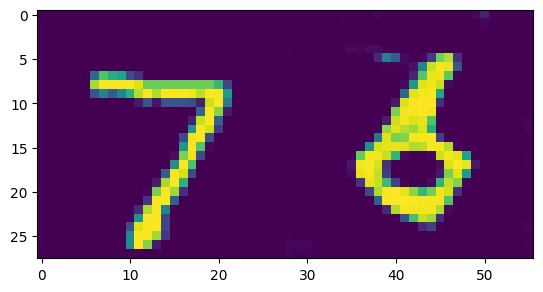

tensor(0.9985, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0511,  0.0385, -0.0961, -0.0748, -0.1276, -0.0089, -0.1085,
        -0.0593, -0.1425], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1075, 0.1009, 0.1104, 0.0965, 0.0986, 0.0935, 0.1053, 0.0953, 0.1001,
        0.0921], grad_fn=<SelectBackward0>)


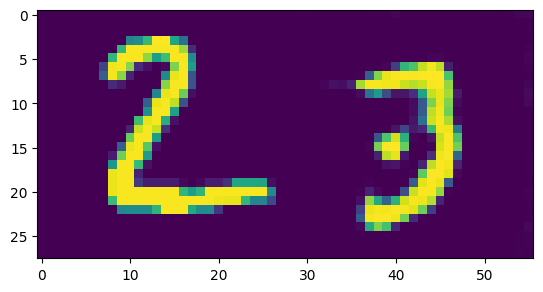

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120,  0.0121,  0.0020, -0.0286, -0.0047, -0.0321, -0.0078, -0.0167,
        -0.0160, -0.0360], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1024, 0.1024, 0.1014, 0.0983, 0.1007, 0.0980, 0.1004, 0.0995, 0.0995,
        0.0976], grad_fn=<SelectBackward0>)


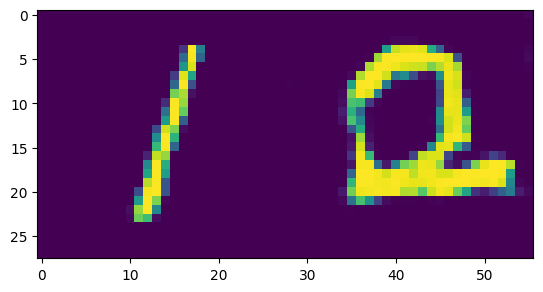

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0224, -0.0069, -0.0922, -0.0316, -0.0892,  0.0314, -0.0783,
        -0.0509, -0.0989], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1055, 0.1020, 0.1035, 0.0951, 0.1010, 0.0954, 0.1076, 0.0964, 0.0991,
        0.0944], grad_fn=<SelectBackward0>)


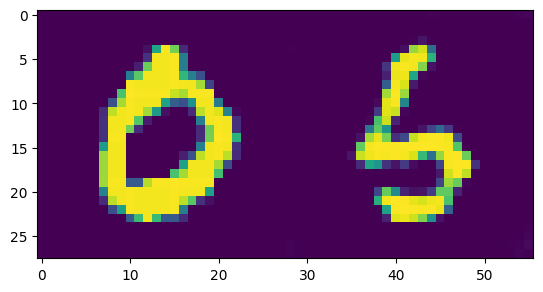

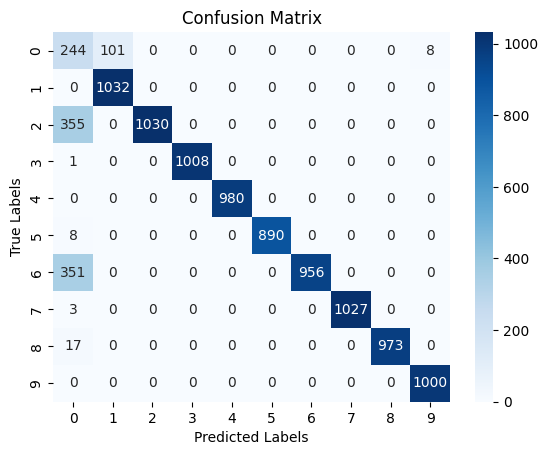

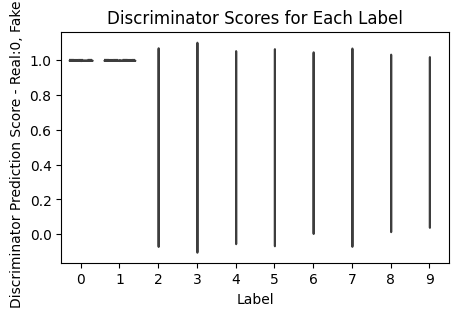

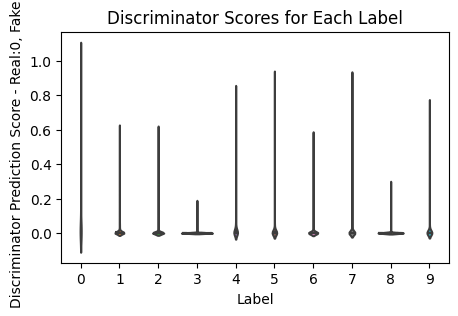

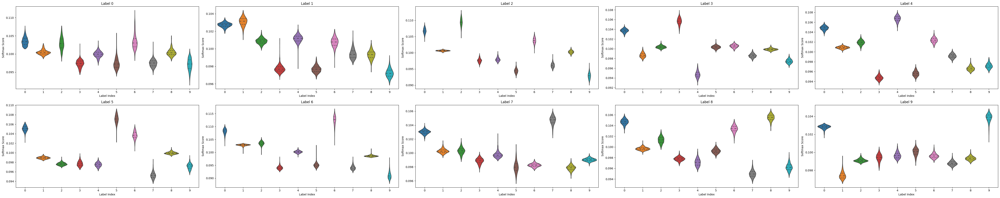

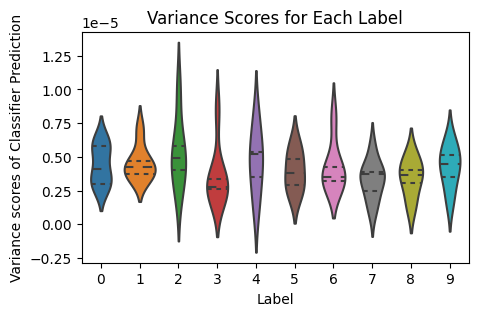

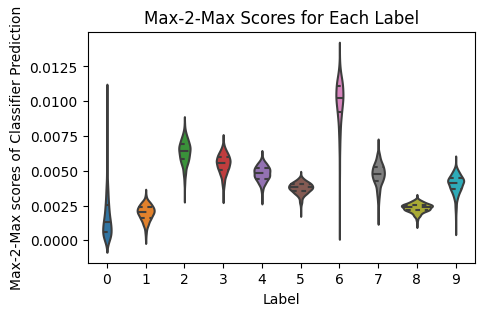

zero_acc: 24.9820, else_acc: 98.7945
it[9100/16890] Loss_E:3.1435736218554666e-06, Loss_DM:6.23886009520902e-09, Loss_R:3.1373347617602576e-06, Loss_D:0.006295275874435902, Loss_G:7.190070152282715
it[9200/16890] Loss_E:1.0401696272310801e-05, Loss_DM:5.879832315258682e-06, Loss_R:4.521863957052119e-06, Loss_D:0.08169016987085342, Loss_G:4.24058198928833
it[9300/16890] Loss_E:1.0962043234030716e-05, Loss_DM:2.1710432065447094e-06, Loss_R:8.791000027486007e-06, Loss_D:0.10189458727836609, Loss_G:4.683769226074219
it[9400/16890] Loss_E:0.0004399702593218535, Loss_DM:0.0003700668166857213, Loss_R:6.990344263613224e-05, Loss_D:0.11481381207704544, Loss_G:7.373025894165039
it[9500/16890] Loss_E:0.015699191018939018, Loss_DM:1.614055278320592e-10, Loss_R:0.01569919085753349, Loss_D:0.030586544424295425, Loss_G:8.210515022277832
it[9600/16890] Loss_E:0.0007625131984241307, Loss_DM:1.4911735846112606e-08, Loss_R:0.0007624982866882846, Loss_D:0.021464183926582336, Loss_G:5.928164482116699
it[97

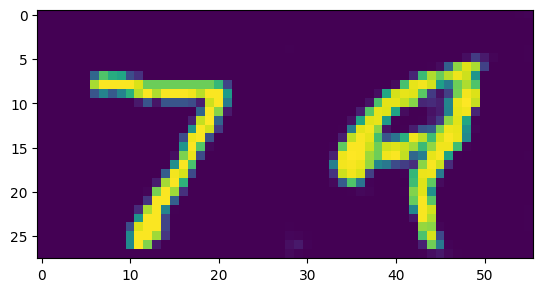

tensor(6.1058e-07, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0502,  0.0295, -0.1075, -0.0659, -0.1337,  0.0063, -0.1141,
        -0.0582, -0.1366], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1071, 0.1010, 0.1094, 0.0954, 0.0995, 0.0929, 0.1069, 0.0948, 0.1002,
        0.0927], grad_fn=<SelectBackward0>)


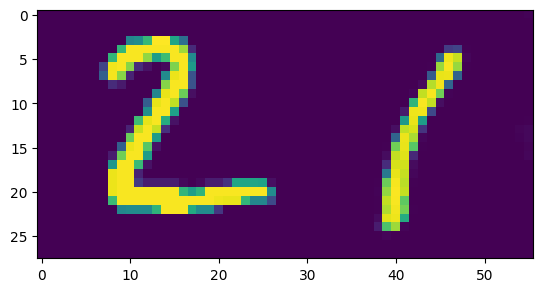

tensor(5.9008e-05, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080,  0.0228, -0.0136, -0.0621, -0.0202, -0.0556,  0.0015, -0.0446,
        -0.0353, -0.0800], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1036, 0.1051, 0.1014, 0.0966, 0.1007, 0.0972, 0.1029, 0.0983, 0.0992,
        0.0949], grad_fn=<SelectBackward0>)


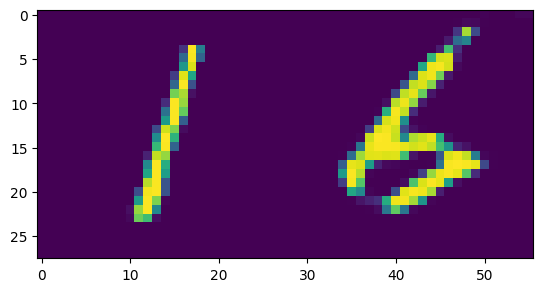

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0067, -0.0026, -0.0145, -0.0061, -0.0100,  0.0043, -0.0104,
        -0.0011, -0.0014], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1016, 0.0997, 0.1001, 0.0989, 0.0997, 0.0994, 0.1008, 0.0993, 0.1003,
        0.1002], grad_fn=<SelectBackward0>)


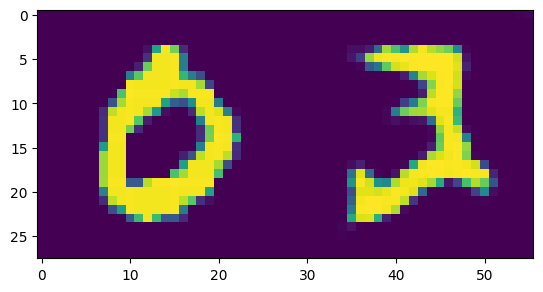

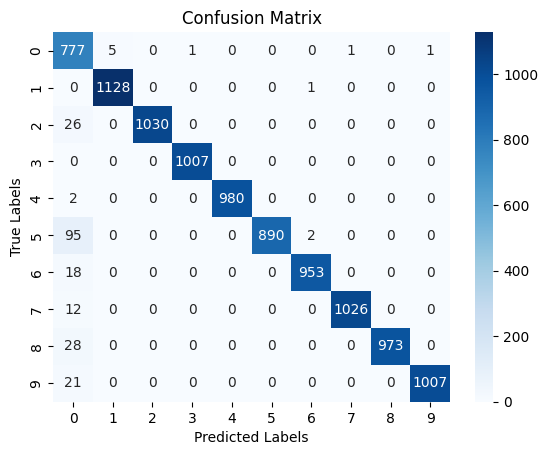

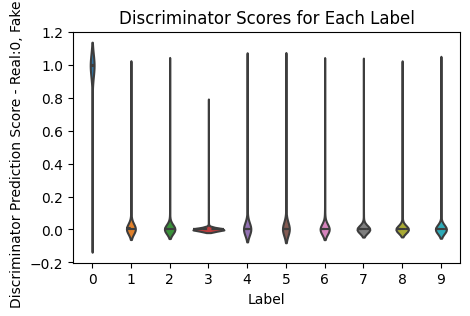

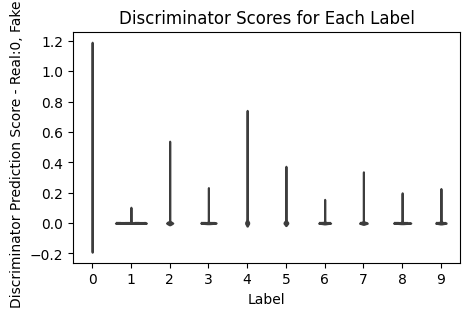

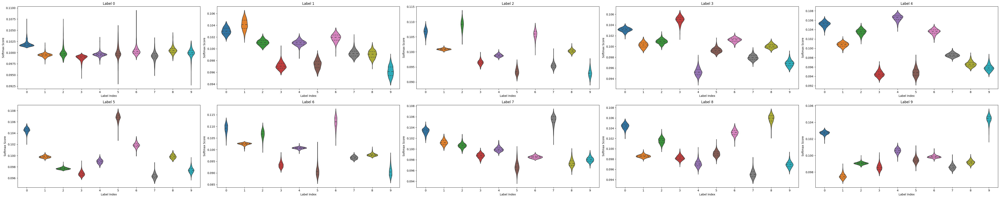

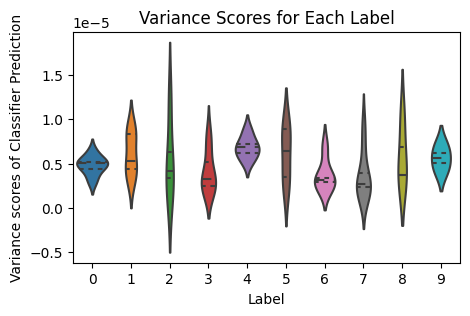

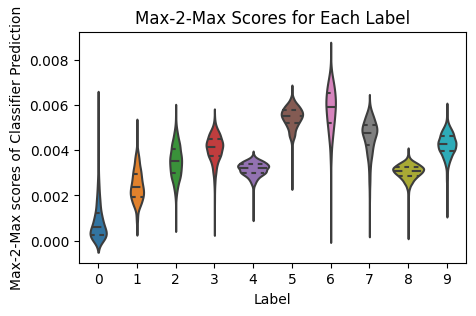

zero_acc: 80.3568, else_acc: 99.8771
it[10100/16890] Loss_E:7.803681364748627e-05, Loss_DM:5.921664524066728e-06, Loss_R:7.211514912341954e-05, Loss_D:0.03799942135810852, Loss_G:5.64846134185791
it[10200/16890] Loss_E:1.153615812654607e-06, Loss_DM:1.863121745770968e-08, Loss_R:1.1349845951968973e-06, Loss_D:0.028846347704529762, Loss_G:7.043483734130859
it[10300/16890] Loss_E:0.0469990111887455, Loss_DM:0.00015292930766008794, Loss_R:0.04684608188108541, Loss_D:0.05681329220533371, Loss_G:4.319833755493164
it[10400/16890] Loss_E:0.02646060287952423, Loss_DM:1.0385276709712343e-06, Loss_R:0.02645956435185326, Loss_D:0.06145879998803139, Loss_G:7.637205600738525
it[10500/16890] Loss_E:0.09131277352571487, Loss_DM:8.999744949278465e-08, Loss_R:0.09131268352826538, Loss_D:0.025494910776615143, Loss_G:5.666968822479248
it[10600/16890] Loss_E:0.3801118731498718, Loss_DM:0.35046353936195374, Loss_R:0.02964833378791809, Loss_D:0.011906003579497337, Loss_G:8.681373596191406
it[10700/16890] Lo

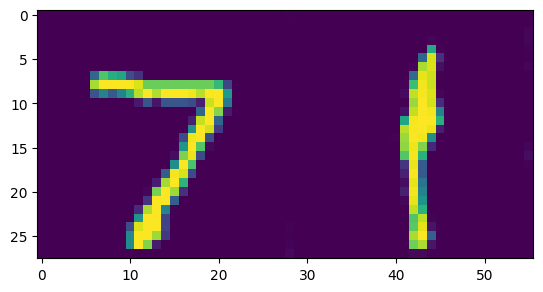

tensor(0.8943, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0116, -0.0668,  0.0400, -0.1291, -0.0791, -0.1438,  0.0051, -0.1391,
        -0.0898, -0.1768], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1090, 0.1008, 0.1121, 0.0947, 0.0995, 0.0933, 0.1083, 0.0937, 0.0985,
        0.0903], grad_fn=<SelectBackward0>)


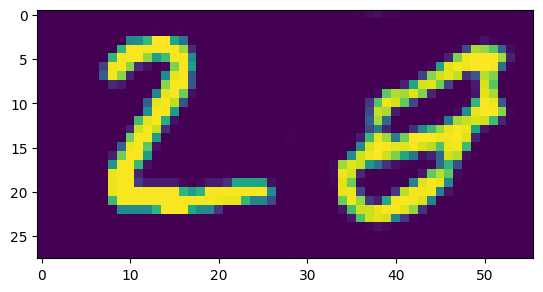

tensor(1.0000, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120,  0.0187, -0.0055, -0.0417, -0.0026, -0.0414, -0.0088, -0.0205,
        -0.0315, -0.0500], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1029, 0.1036, 0.1011, 0.0975, 0.1014, 0.0976, 0.1008, 0.0996, 0.0986,
        0.0967], grad_fn=<SelectBackward0>)


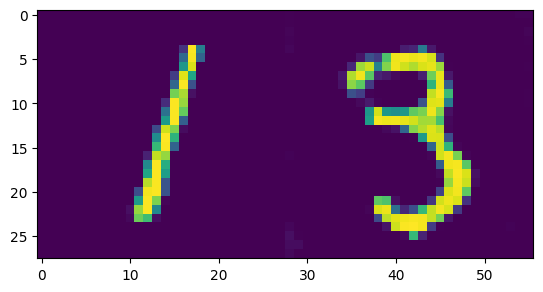

tensor(1.0000, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0207, -0.0071, -0.1050, -0.0347, -0.1023,  0.0351, -0.0747,
        -0.0642, -0.1112], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1060, 0.1026, 0.1040, 0.0943, 0.1011, 0.0945, 0.1085, 0.0972, 0.0982,
        0.0937], grad_fn=<SelectBackward0>)


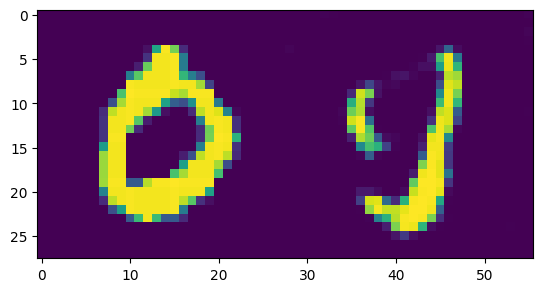

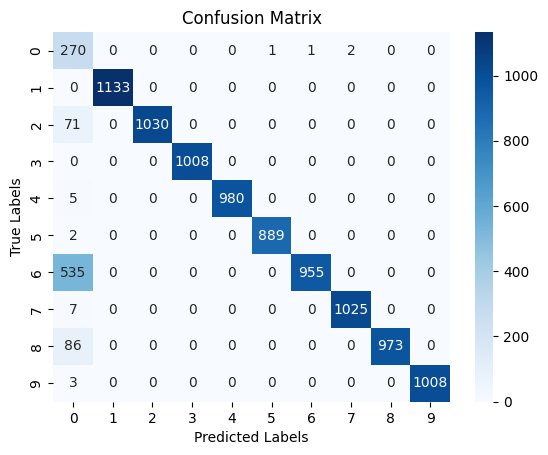

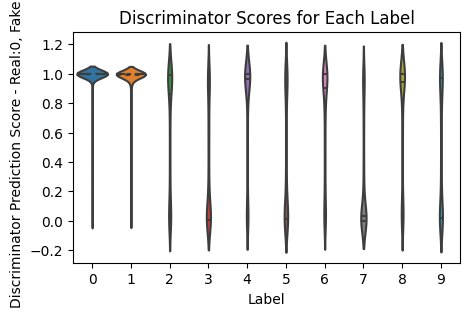

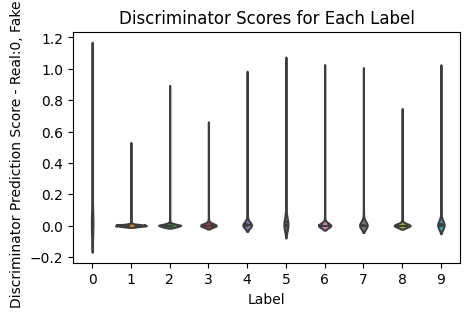

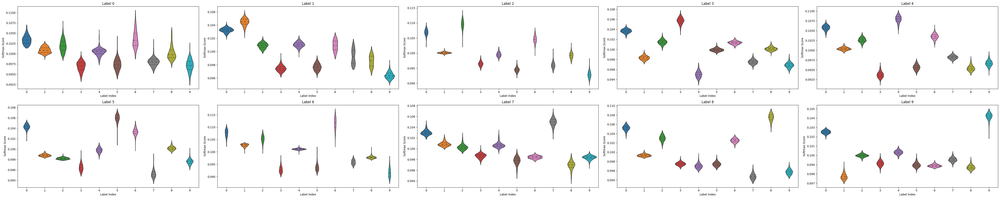

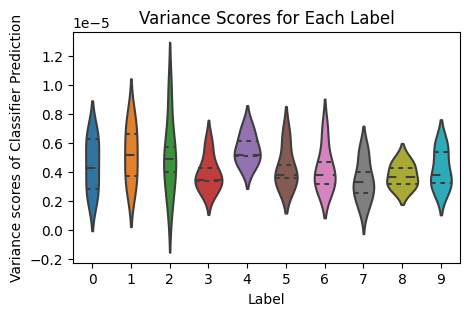

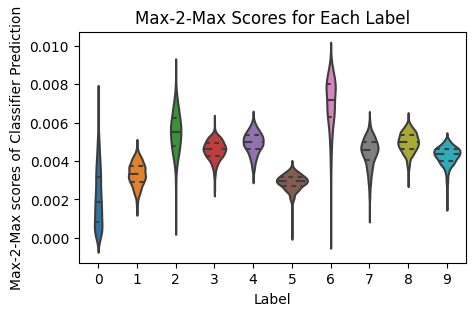

zero_acc: 26.5527, else_acc: 99.9564
it[11100/16890] Loss_E:4.9412192311137915e-05, Loss_DM:4.1176273953169584e-05, Loss_R:8.23591835796833e-06, Loss_D:0.0267985537648201, Loss_G:5.944823741912842
it[11200/16890] Loss_E:0.03579078987240791, Loss_DM:0.006121382582932711, Loss_R:0.029669407289475203, Loss_D:0.055477574467659, Loss_G:6.6335649490356445
it[11300/16890] Loss_E:2.0235647752997465e-06, Loss_DM:2.2578904079750828e-08, Loss_R:2.0009858712199957e-06, Loss_D:0.015184590592980385, Loss_G:6.878303050994873
it[11400/16890] Loss_E:7.856991715016193e-07, Loss_DM:5.436523453639097e-11, Loss_R:7.856448062670829e-07, Loss_D:0.08591455221176147, Loss_G:7.039080619812012
it[11500/16890] Loss_E:0.0006508975056931376, Loss_DM:5.636733112623915e-05, Loss_R:0.0005945301745668985, Loss_D:0.17020805180072784, Loss_G:8.376741409301758
it[11600/16890] Loss_E:0.09748595952987671, Loss_DM:3.767517409158927e-09, Loss_R:0.0974859557623593, Loss_D:0.012173655442893505, Loss_G:6.525104999542236
it[11700

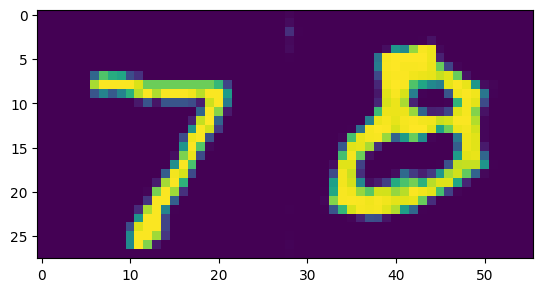

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0476,  0.0380, -0.0935, -0.0777, -0.1054,  0.0062, -0.1187,
        -0.0608, -0.1426], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1072, 0.1010, 0.1100, 0.0965, 0.0980, 0.0953, 0.1066, 0.0941, 0.0997,
        0.0918], grad_fn=<SelectBackward0>)


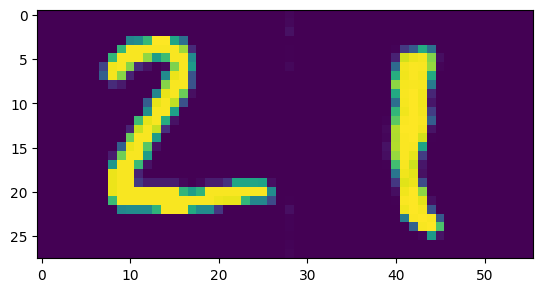

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120,  0.0203, -0.0043, -0.0476, -0.0058, -0.0428, -0.0070, -0.0282,
        -0.0348, -0.0584], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1032, 0.1040, 0.1015, 0.0972, 0.1014, 0.0977, 0.1012, 0.0991, 0.0985,
        0.0962], grad_fn=<SelectBackward0>)


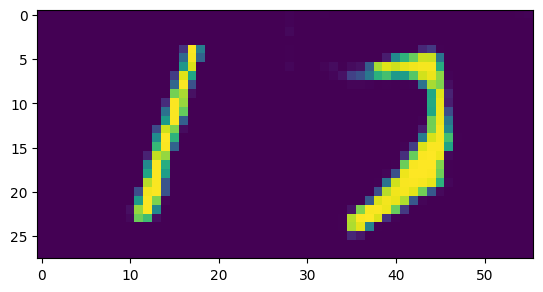

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0107, -0.0078, -0.0583, -0.0198, -0.0572,  0.0170, -0.0381,
        -0.0214, -0.0518], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1036, 0.1013, 0.1016, 0.0966, 0.1003, 0.0967, 0.1041, 0.0985, 0.1002,
        0.0972], grad_fn=<SelectBackward0>)


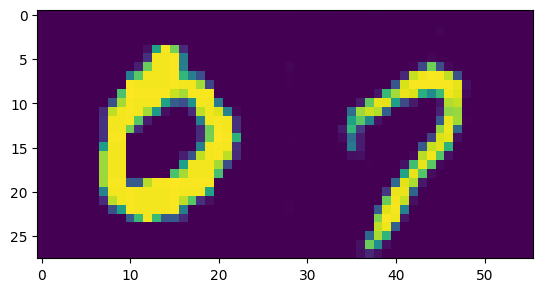

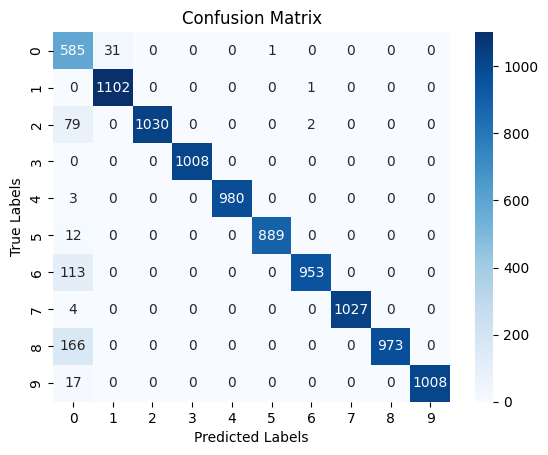

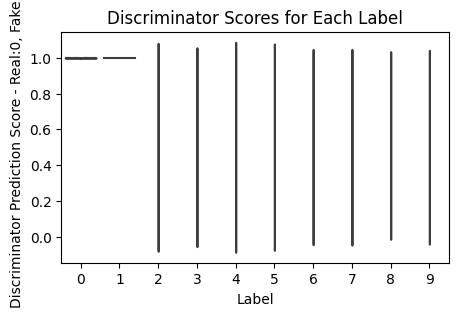

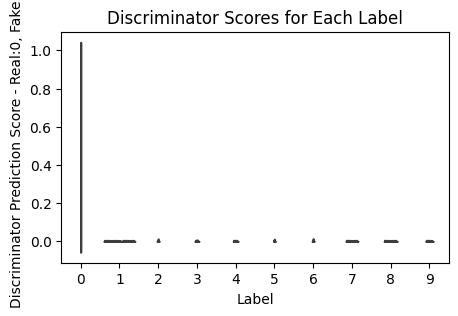

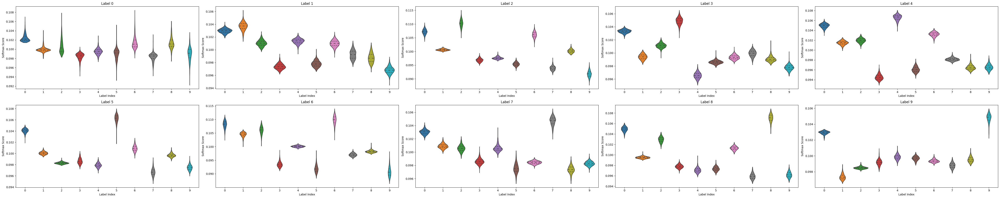

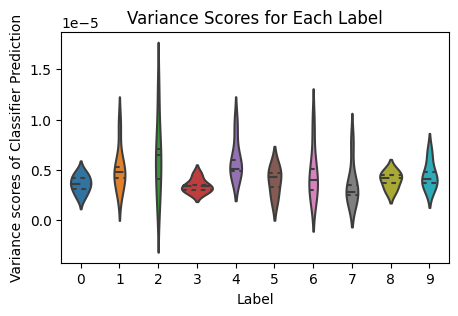

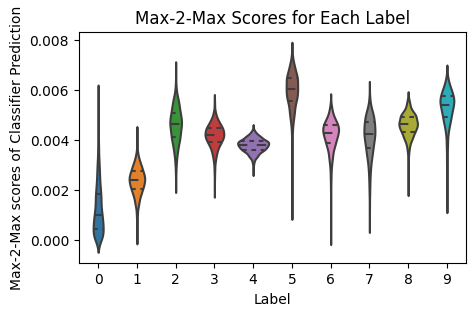

zero_acc: 60.1328, else_acc: 99.6077
it[12100/16890] Loss_E:2.396576519458904e-06, Loss_DM:1.8322696178074693e-06, Loss_R:5.643069016514346e-07, Loss_D:0.14806534349918365, Loss_G:2.9833920001983643
it[12200/16890] Loss_E:0.006847943179309368, Loss_DM:0.006845374591648579, Loss_R:2.5685876607894897e-06, Loss_D:0.01235722191631794, Loss_G:5.854272365570068
it[12300/16890] Loss_E:4.327587885200046e-05, Loss_DM:4.215920125716366e-05, Loss_R:1.1166775948368013e-06, Loss_D:0.04776953533291817, Loss_G:8.1997652053833
it[12400/16890] Loss_E:0.004765715915709734, Loss_DM:9.183849556393398e-07, Loss_R:0.004764797530754095, Loss_D:0.018434280529618263, Loss_G:6.612242698669434
it[12500/16890] Loss_E:0.0001505801046732813, Loss_DM:4.8429594556864686e-08, Loss_R:0.00015053167507872445, Loss_D:0.023859817534685135, Loss_G:6.767995834350586
it[12600/16890] Loss_E:6.48998175165616e-05, Loss_DM:4.2946372911904784e-14, Loss_R:6.489981747361522e-05, Loss_D:0.06647853553295135, Loss_G:5.269765853881836
i

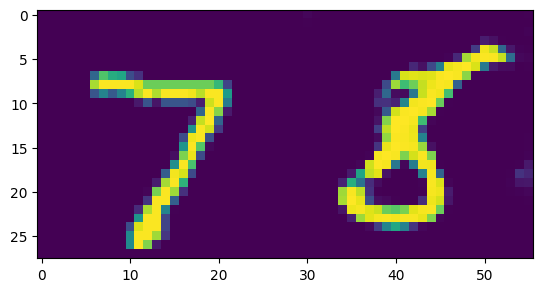

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0499,  0.0321, -0.0911, -0.0761, -0.1179,  0.0150, -0.1155,
        -0.0567, -0.1359], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1071, 0.1007, 0.1093, 0.0966, 0.0981, 0.0941, 0.1074, 0.0943, 0.1000,
        0.0924], grad_fn=<SelectBackward0>)


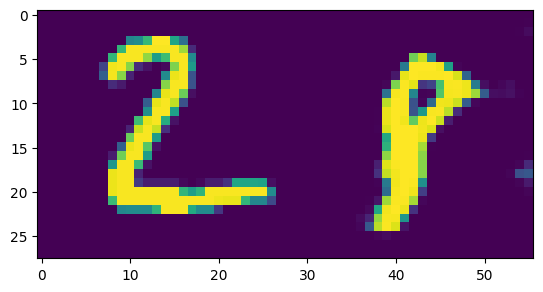

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120,  0.0256, -0.0041, -0.0586, -0.0051, -0.0537,  0.0008, -0.0389,
        -0.0441, -0.0718], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1036, 0.1050, 0.1019, 0.0965, 0.1018, 0.0970, 0.1024, 0.0985, 0.0979,
        0.0953], grad_fn=<SelectBackward0>)


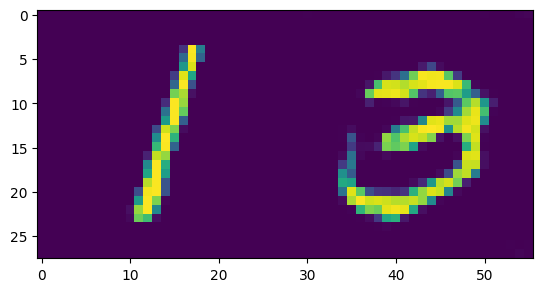

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0307,  0.0106, -0.0787, -0.0384, -0.0932,  0.0248, -0.0701,
        -0.0339, -0.0860], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1051, 0.1007, 0.1049, 0.0960, 0.0999, 0.0946, 0.1064, 0.0968, 0.1004,
        0.0953], grad_fn=<SelectBackward0>)


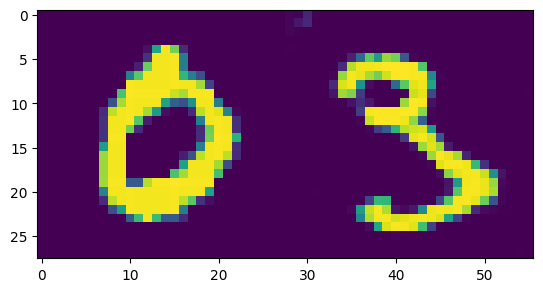

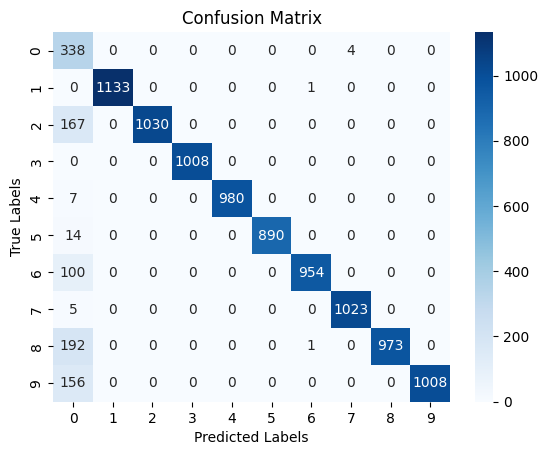

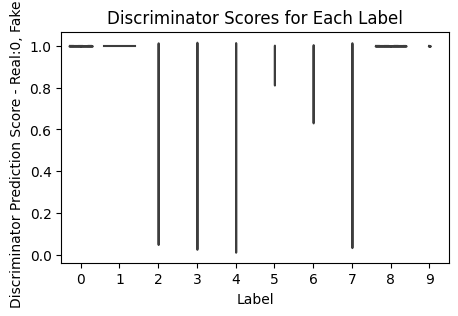

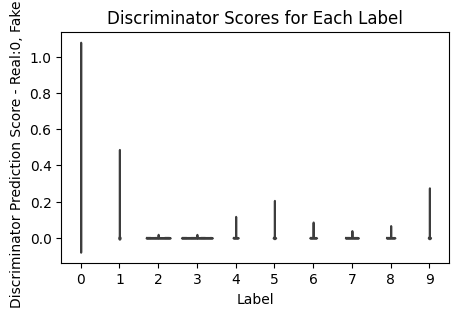

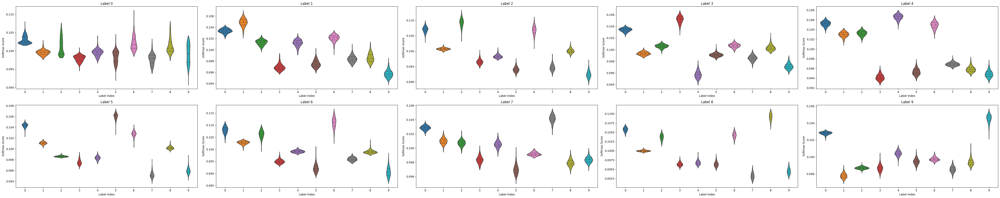

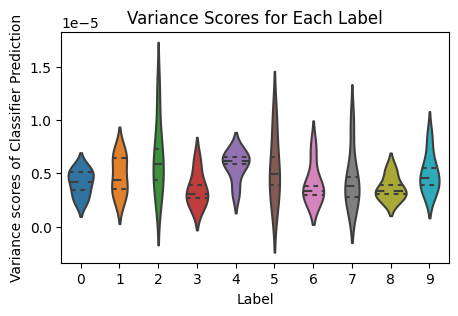

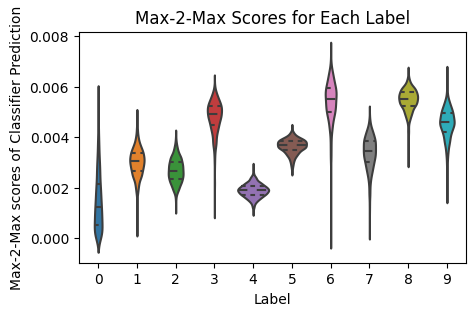

zero_acc: 33.2926, else_acc: 99.9336
it[13100/16890] Loss_E:0.03504430875182152, Loss_DM:9.853726078290492e-05, Loss_R:0.03494577149103861, Loss_D:0.018080949783325195, Loss_G:6.113866806030273
it[13200/16890] Loss_E:1.1458120070528821e-06, Loss_DM:6.886585524057409e-09, Loss_R:1.1389254215288247e-06, Loss_D:0.004440838471055031, Loss_G:8.53199577331543
it[13300/16890] Loss_E:0.0009132045088335872, Loss_DM:9.489030503573304e-07, Loss_R:0.0009122556057832298, Loss_D:0.027981530874967575, Loss_G:8.129966735839844
it[13400/16890] Loss_E:5.769175459136022e-06, Loss_DM:2.720439706838107e-10, Loss_R:5.7689034151653384e-06, Loss_D:0.10158856213092804, Loss_G:4.236954689025879
it[13500/16890] Loss_E:5.9252965002087876e-05, Loss_DM:9.770218488414084e-12, Loss_R:5.925295523186939e-05, Loss_D:0.02780415490269661, Loss_G:7.195097923278809
it[13600/16890] Loss_E:2.784617549878021e-07, Loss_DM:3.7372016592485124e-09, Loss_R:2.747245533285536e-07, Loss_D:0.6375667452812195, Loss_G:7.7370476722717285


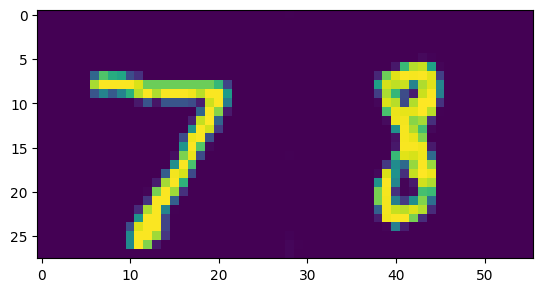

tensor(0.0001, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0080, -0.0453,  0.0352, -0.0979, -0.0596, -0.1335, -0.0006, -0.0926,
        -0.0555, -0.1180], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1065, 0.1009, 0.1094, 0.0958, 0.0995, 0.0924, 0.1055, 0.0963, 0.0999,
        0.0938], grad_fn=<SelectBackward0>)


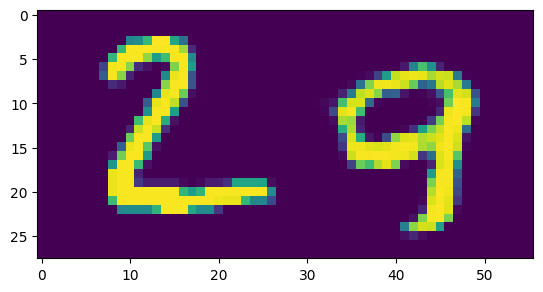

tensor(0.0608, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0082,  0.0190,  0.0032, -0.0423, -0.0087, -0.0449, -0.0017, -0.0275,
        -0.0298, -0.0537], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1026, 0.1037, 0.1021, 0.0976, 0.1009, 0.0973, 0.1016, 0.0990, 0.0988,
        0.0964], grad_fn=<SelectBackward0>)


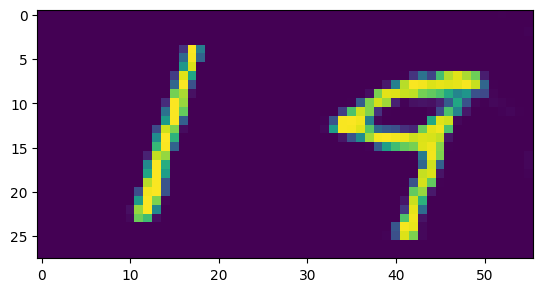

tensor(0.9788, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0119, -0.0181, -0.0055, -0.1009, -0.0740, -0.1320,  0.0437, -0.0746,
        -0.0605, -0.1407], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1067, 0.1036, 0.1049, 0.0954, 0.0980, 0.0924, 0.1102, 0.0979, 0.0993,
        0.0916], grad_fn=<SelectBackward0>)


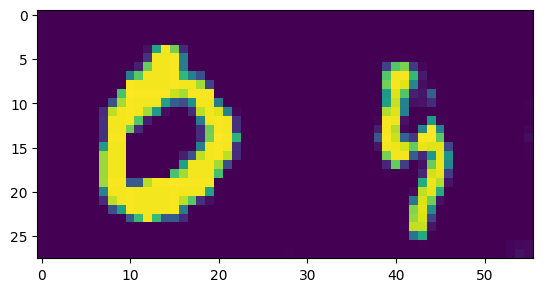

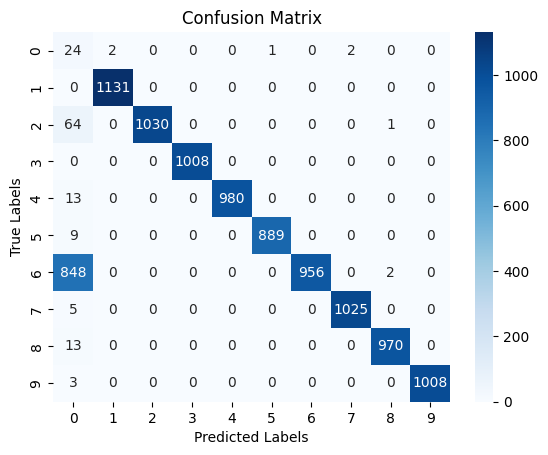

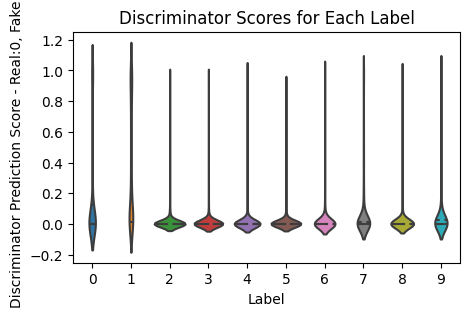

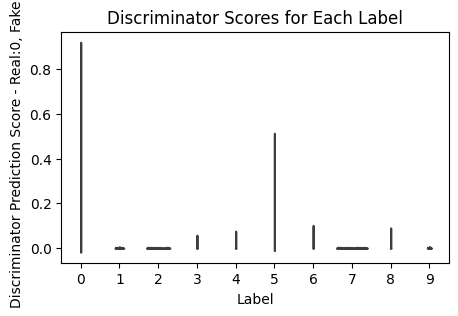

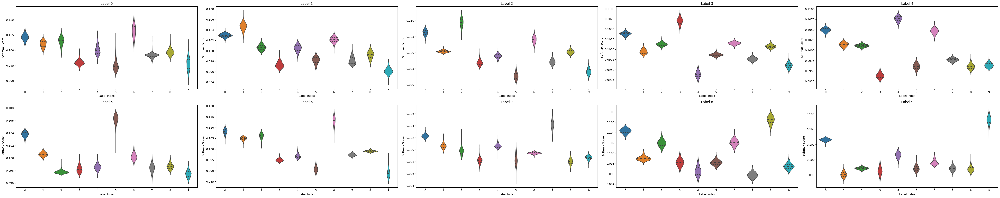

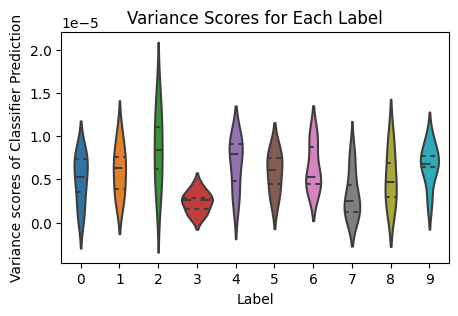

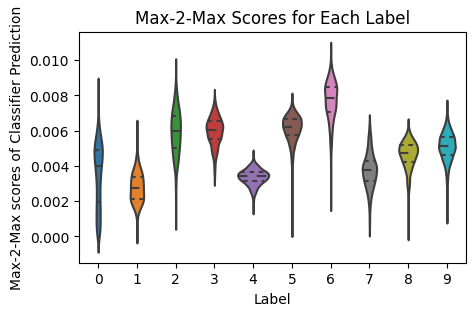

zero_acc: 2.8266, else_acc: 99.9114
it[14100/16890] Loss_E:1.6219984900089912e-05, Loss_DM:1.415867867393672e-09, Loss_R:1.621856903222252e-05, Loss_D:0.015345191583037376, Loss_G:6.191712379455566
it[14200/16890] Loss_E:2.293893885507714e-06, Loss_DM:2.2627520245965121e-13, Loss_R:2.2938936592325115e-06, Loss_D:0.006573019083589315, Loss_G:8.269023895263672
it[14300/16890] Loss_E:1.8781325707095675e-05, Loss_DM:5.963224793958943e-07, Loss_R:1.818500322769978e-05, Loss_D:0.5365347862243652, Loss_G:6.673776149749756
it[14400/16890] Loss_E:8.32029741104634e-07, Loss_DM:3.1061378535923723e-07, Loss_R:5.214159557453968e-07, Loss_D:0.04573650285601616, Loss_G:7.839996337890625
it[14500/16890] Loss_E:0.0003926953941117972, Loss_DM:7.322491571426504e-12, Loss_R:0.00039269538678930564, Loss_D:0.002537008374929428, Loss_G:9.206262588500977
it[14600/16890] Loss_E:5.922166934624329e-08, Loss_DM:5.483342512685452e-12, Loss_R:5.92161860037306e-08, Loss_D:0.013439335860311985, Loss_G:6.8995723724365

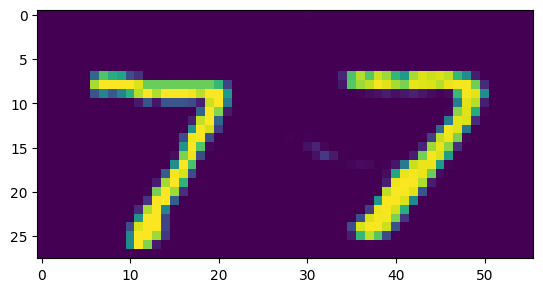

tensor(1.0000, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0390,  0.0290, -0.0960, -0.0217, -0.0995,  0.0078, -0.0865,
        -0.0437, -0.0897], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1055, 0.1003, 0.1073, 0.0947, 0.1020, 0.0944, 0.1051, 0.0956, 0.0998,
        0.0953], grad_fn=<SelectBackward0>)


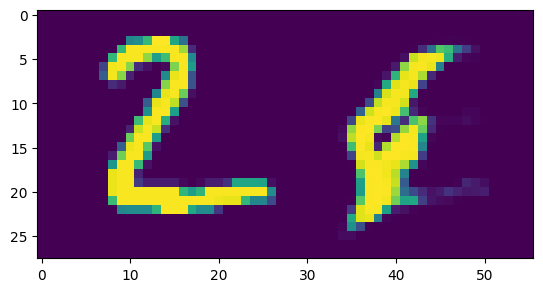

tensor(1.0000, device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120,  0.0234, -0.0083, -0.0500, -0.0105, -0.0485, -0.0113, -0.0157,
        -0.0371, -0.0555], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1032, 0.1044, 0.1012, 0.0970, 0.1009, 0.0972, 0.1009, 0.1004, 0.0983,
        0.0965], grad_fn=<SelectBackward0>)


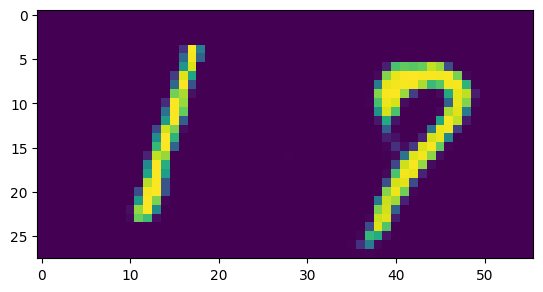

tensor(1., device='cuda:0', grad_fn=<SelectBackward0>)
tensor([ 0.0120, -0.0223, -0.0099, -0.1087, -0.0484, -0.0996,  0.0470, -0.1017,
        -0.0529, -0.1258], device='cuda:0', grad_fn=<SelectBackward0>)
tensor([0.1063, 0.1028, 0.1040, 0.0943, 0.1001, 0.0951, 0.1101, 0.0949, 0.0997,
        0.0927], grad_fn=<SelectBackward0>)


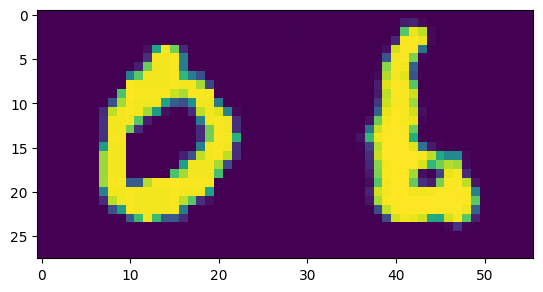

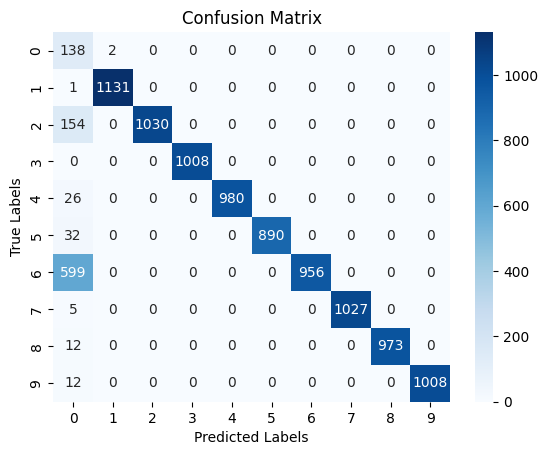

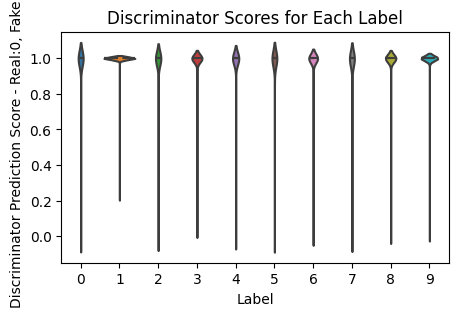

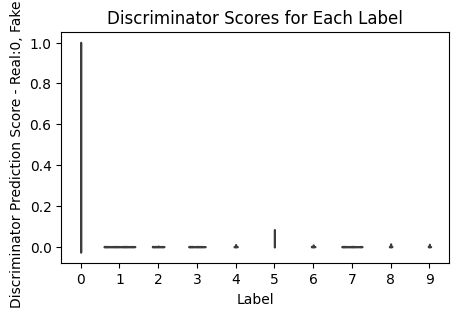

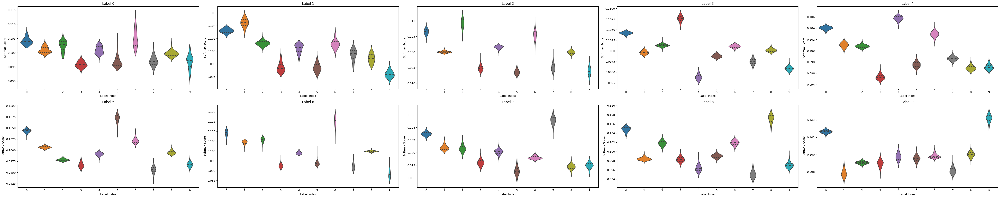

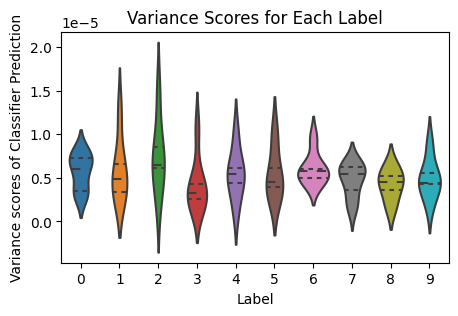

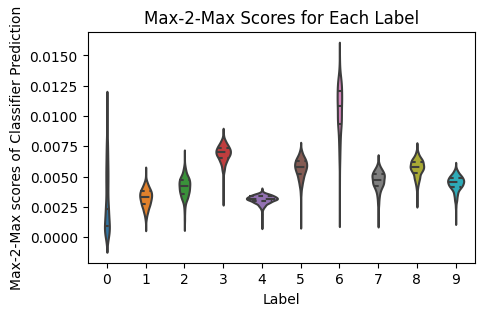

zero_acc: 13.8228, else_acc: 99.9789
it[15100/16890] Loss_E:6.465426921844482, Loss_DM:6.4601945877075195, Loss_R:0.005232334136962891, Loss_D:0.013785981573164463, Loss_G:6.277687072753906
it[15200/16890] Loss_E:2.0760755887749838e-06, Loss_DM:2.7567287474994373e-07, Loss_R:1.80040271402504e-06, Loss_D:0.041627272963523865, Loss_G:4.111766815185547
it[15300/16890] Loss_E:2.4195334844989702e-05, Loss_DM:1.1530878045473182e-14, Loss_R:2.4195334833458826e-05, Loss_D:0.058688148856163025, Loss_G:4.086385250091553
it[15400/16890] Loss_E:8.96480560186319e-06, Loss_DM:6.405192673995808e-13, Loss_R:8.964804961343923e-06, Loss_D:0.06939451396465302, Loss_G:6.99755859375
it[15500/16890] Loss_E:0.03381679579615593, Loss_DM:4.542670684060113e-09, Loss_R:0.033816791253485246, Loss_D:0.1593398153781891, Loss_G:7.857287406921387
it[15600/16890] Loss_E:0.0005455155624076724, Loss_DM:0.00029426164110191166, Loss_R:0.00025125392130576074, Loss_D:0.2080996334552765, Loss_G:6.752371788024902


In [ ]:
# added plot of both discriminator's prediction scores & variance and max-2-max of softmax scores
# applied the 'variance modulation' method (not yet)
# discriminator의 optimizer에서의 beta 줄인 후 (0.25, 0.599)
# T = 15에서 T = 1000으로 바꾼 후 softmax score 출력
# discriminator output range: 0.008 ~ 0.012로 설정
# resnet-based model's discriminator 사용
# Added "subtracting perturbation" method - reverse FGSM
# Additional discriminator for min-max training versus generative model
# lr_g = 1e-4 / beta_1_g = 0.35 / beta_2_g = 0.699
# 최고성능: zero_acc: 96.9353, else_acc: 99.5853 -> train_per_sub_sep_discrim/it1000.pt

print('STEP 7: TRAIN THE MODEL')
torch.backends.cudnn.enabled = False

mbs = 4

label_real = torch.full((bs,), real_label, dtype=torch.float32, device=device)
# label_real_s = torch.full((mbs, 1, 4, 4), real_label, dtype=torch.float32, device=device)
label_fake = torch.full((bs,), fake_label, dtype=torch.float32, device=device)
# label_fake_s = torch.full((mbs, 1, 4, 4), fake_label, dtype=torch.float32, device=device)

num_iter = 0
max_iter = num_epochs*len(train_loader)

for epoch in range(1, num_epochs+1):
    correct = 0
    model.train()
    discriminator.train()
    generator_prime.train()

    for batch_index, (data, labels) in enumerate(train_loader):
        model.train()
        discriminator.train()
        generator_prime.train()

        data = data.to(device)
        noise = torch.randn(bs, z_size, 1, 1, device=device)
        gen_fake = generator_prime(noise)
        labels = nn.functional.one_hot(labels, 10).to(torch.float32).to(device)

        ### Update discriminator model ###
        #######################################
        discriminator.zero_grad()

        disc_T_real = discriminator(data)

        err_DT_real = criterion(disc_T_real, label_real)

        disc_T_fake = discriminator(gen_fake.detach())

        err_DT_fake = criterion(disc_T_fake, label_fake)

        err_DT = err_DT_real + err_DT_fake

        err_DT.backward()

        optimizer_D.step()
        #######################################

        ### Update EuiNet model ###
        #######################################
        model.zero_grad()
        
        pred_real, disc_real, _, _, _ = model(data)
        err_D_real = criterion(disc_real, label_real)
        err_pred_real = criterion(pred_real, labels)

        pred_g_fake, disc_g_fake, _, _, _ = model(gen_fake.detach())
        err_D_g_fake = criterion(disc_g_fake, label_fake)

        err_D = err_D_real + err_D_g_fake
        err_pred = err_pred_real
        err = err_D + err_pred

        # Getting gradients w.r.t. parameters
        err.backward()
        # Updating parameters
        optimizer_M.step()
        #######################################
        

        ### Update generator model ###
        #######################################
        # Clear gradients w.r.t. parameters
        generator_prime.zero_grad()
        
        disc_g_fake_g = discriminator(gen_fake)

        err_G_fake_g = criterion(disc_g_fake_g, label_real)

        err_G_fake_g.backward()
        
        # Update Parameters
        optimizer_prime.step()
        #######################################
        
        
        num_iter += 1
        # Output training stats
        if num_iter%100 == 0:
            print(f'it[{num_iter}/{max_iter}] Loss_E:{err.item()}, Loss_DM:{err_D.item()}, Loss_R:{err.item()-err_D.item()}, Loss_D:{err_DT.item()}, Loss_G:{err_G_fake_g.item()}')

        if num_iter == 10 or num_iter == 500 or num_iter%1000==0 or num_iter==max_iter:
            save_name = os.path.join(save_dir, 'it{:04d}.pt'.format(num_iter))
            torch.save({
                'model': model.state_dict(),
                'model_G_prime': generator_prime.state_dict(), 
                'model_D': discriminator.state_dict()
            }, save_name)
            ### initialize metric variables ###
            #######################################
            acc_zero = Meter()
            acc_else = Meter()
            softmax_scores = {}
            true_labels = []
            predicted_labels = []
            h_scores = []
            max_2_max_scores = []
            disc_scores = []
            variance_scores = []
            #######################################

            ### set models to evaluation mode ###
            #######################################
            model.eval()
            discriminator.eval()
            generator_prime.eval()
            #######################################

            # with torch.no_grad():
            for i, (data, labels) in enumerate(test_loader):
              # Get 0~9 classification output logits / size : Batch x 10
              data = data.to(device)
              labels = labels.to(device)
              noise = torch.randn(bs, z_size, 1, 1, device=device)
              data.requires_grad = True   # set requires_grad attribute of tensor
              rs, h, logits, rdnha, rdivs = model(data)
              init_pred = logits.max(1, keepdim=True)[1] # get the index of the max log-probability

              ### apply perturbation subtraction ###
              # perturbation을 구하기 위해서는 model에 original data를 한 번 forwarding 시킨 후,
              # loss를 구한 다음에 backward를 시켰을 때 발생하는 gradient 값을 얻어내야 합니다. 
              # 따라서 해당 기능을 수행하는 코드는 모델 자체의 training variable을 통해 모델이 조건부적으로 동작하도록 하는 것이 아닌, 
              # 모델 외부에서 model.zero_grad(), loss.backward() 등의 함수를 사용해야 합니다.
              # 만약 모델 내부에 해당 기능을 수행하는 코드를 넣게 된다면, model 안에서 다시 model을 호출해야 하는 재귀적인 문제가 발생하게 됩니다. 
              # 위와 같은 이유로 모델 안에서 해당 기능을 구현하는 것은 구조 상 모순이 발생하므로 불가능합니다.
              # 따라서 testing code에 해당 코드가 반드시 포함되어야 합니다.  
              #######################################
              loss = F.nll_loss(logits, labels)
              model.zero_grad()
              loss.backward()
              data_grad = data.grad.data
              data_denorm = denorm(data)
              perturbed_data = subtract_perturbation(data_denorm, epsilon, data_grad)
              perturbed_data_normalized = transforms.Normalize((0.5,), (0.5,))(perturbed_data)
              rs, h, logits, rdnha, rdivs = model(perturbed_data_normalized)
              #######################################
              disc_output = discriminator(perturbed_data_normalized)

              ### Obtaining max-2-max scores ###
              #######################################
              max_values, max_indices = torch.max(rdivs, 1)
              # Creating a mask for the maximum values
              max_mask = torch.zeros_like(rdivs, dtype=torch.bool)
              max_mask.scatter_(1, max_indices.unsqueeze(1), True)
              # Setting the maximum values to a very small number
              rdivs[max_mask] = float('-inf')
              # Finding the second maximum values along dimension 1
              second_max_values, _ = torch.max(rdivs, dim=1)
              # Obtaining the max-2-max score by subtracting
              max_2_max = torch.sub(max_values, second_max_values).cpu()
              #######################################

              logits = logits.cpu()
              scores = logits.detach().numpy()
              ### Obtaining prediction & softmax scores ###
              ####################################################
              predicted = torch.argmax(logits.data, 1)
              true_labels.extend(labels.cpu().numpy())
              predicted_labels.extend(predicted.cpu().numpy())
              h_scores.extend(h.detach().cpu().numpy())
              disc_scores.extend(disc_output.detach().cpu().numpy())
              variance = torch.var(rdivs, dim=0, unbiased=False)
              variance_scores.extend(variance.detach().cpu().numpy())
              max_2_max_scores.extend(max_2_max.detach().data.numpy())
              ####################################################
              
              gen_prime_output = generator_prime(noise)
              

              data = ((data+1)/2).cpu().data.numpy()
              gen_prime_output = ((gen_prime_output + 1)/2).cpu().data.numpy()
              
              if i == 0:
                for vis_idx in range(vis_num):
                    print(h[vis_idx])
                    print(rdnha[vis_idx])
                    print(logits[vis_idx])
                    data_ = transpose(data)[vis_idx]
                    gen_prime_output_ = transpose(gen_prime_output)[vis_idx]
                    outputs = np.concatenate((data_, gen_prime_output_), axis=1)
                    plt.imshow(outputs)
                    plt.pause(0.001)

              for label, score in zip(labels.cpu().numpy(), scores):
                if label not in softmax_scores:
                  softmax_scores[label] = []
                softmax_scores[label].append(score)
              
              labels = labels.cpu()
              zero_acc, else_acc = compute_accuracy(logits, labels)
              if zero_acc != None:
                  acc_zero.update(zero_acc)
                  acc_else.update(else_acc)
              else:
                  acc_else.update(else_acc)

            for label in softmax_scores:
              softmax_scores[label] = np.array(softmax_scores[label])

            true_labels = np.array(true_labels)
            predicted_labels = np.array(predicted_labels)
            h_scores = np.array(h_scores)
            disc_scores = np.array(disc_scores)
            max_2_max_scores = np.array(max_2_max_scores)
            variance_scores = np.array(variance_scores)

            # Plot the confusion matrix for each label 0~9
            plot_conf_mat(true_labels, predicted_labels)

            # Plot model's discriminator's prediction scores for each label 0~9
            plot_discriminator_scores(h_scores, true_labels)

            # Plot discriminator's prediction scores for each label 0~9
            plot_discriminator_scores(disc_scores, true_labels)

            # Plot the softmax score distribution for each label 0~9
            plot_softmax_distribution(softmax_scores)

            # Plot the variance score distribution for each label 0~9
            plot_variance_scores(variance_scores, true_labels)

            # Plot the max-2-max score distribution for each label 0~9
            plot_max_2_max_scores(max_2_max_scores, true_labels)



            print("zero_acc: {:.4f}, else_acc: {:.4f}".format(acc_zero.avg(), acc_else.avg()))

In [28]:
# please put the absolute path where the model is saved
PATH = "/content/gdrive/MyDrive/MNIST/ej/weights/train_per_sub_sep_discrim/it1000.pt"  # this code must be changed

In [29]:
model.load_state_dict(torch.load(PATH)['model'])
model.eval()
generator_prime.load_state_dict(torch.load(PATH)['model_G_prime'])
generator_prime.eval()

Generator(
  (upconv1): Sequential(
    (0): ConvTranspose2d(784, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (upconv2): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (upconv3): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (upconv4): Sequential(
    (0): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): Tanh()
  )
)

# Test Your Model
## **Do not modify this cell**
zero(0) / else(1~9) Accuracy 따로 측정



In [31]:
class Meter:
    def __init__(self):
        self.list = []
    def update(self, item):
        self.list.append(item)
    def avg(self):
        return torch.tensor(self.list).mean() if len(self.list) else None

def compute_accuracy(logits, labels):
  pred = torch.argmax(logits, dim=1)
  zero_idx= ((labels==0).nonzero(as_tuple=True)[0])
  else_idx= ((labels!=0).nonzero(as_tuple=True)[0])

  if len(zero_idx) == 0:
    zero_acc = None
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  else:
    zero_acc = (pred[zero_idx] == labels[zero_idx]).type(torch.float).mean().item()*100
    else_acc = (pred[else_idx] == labels[else_idx]).type(torch.float).mean().item()*100
  return zero_acc, else_acc

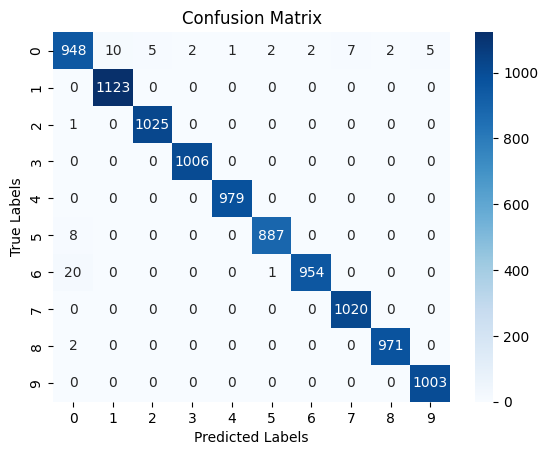

zero_acc: 96.9353, else_acc: 99.5853


In [33]:
### initialize metric variables ###
#######################################
acc_zero = Meter()
acc_else = Meter()
true_labels = []
predicted_labels = []
#######################################

### set models to evaluation mode ###
#######################################
model.eval()
generator_prime.eval()
#######################################

# with torch.no_grad():
for i, (data, labels) in enumerate(test_loader):
  # Get 0~9 classification output logits / size : Batch x 10
  data = data.to(device)
  labels = labels.to(device)
  noise = torch.randn(bs, z_size, 1, 1, device=device)
  data.requires_grad = True   # set requires_grad attribute of tensor
  rs, h, logits, rdnha, rdivs = model(data)

  ### apply perturbation subtraction ###
  # perturbation을 구하기 위해서는 model에 original data를 한 번 forwarding 시킨 후,
  # loss를 구한 다음에 backward를 시켰을 때 발생하는 gradient 값을 얻어내야 합니다. 
  # 따라서 해당 기능을 수행하는 코드는 모델 자체의 training variable을 통해 모델이 조건부적으로 동작하도록 하는 것이 아닌, 
  # 모델 외부에서 model.zero_grad(), loss.backward() 등의 함수를 사용해야 합니다.
  # 만약 모델 내부에 해당 기능을 수행하는 코드를 넣게 된다면, model 안에서 다시 model을 호출해야 하는 재귀적인 문제가 발생하게 됩니다. 
  # 위와 같은 이유로 모델 안에서 해당 기능을 구현하는 것은 구조 상 모순이 발생하므로 불가능합니다.
  # 따라서 testing code에 해당 코드가 반드시 포함되어야 합니다. 
  #######################################
  loss = F.nll_loss(logits, labels)
  model.zero_grad()
  loss.backward()
  data_grad = data.grad.data
  data_denorm = denorm(data)
  perturbed_data = subtract_perturbation(data_denorm, epsilon, data_grad)
  perturbed_data_normalized = transforms.Normalize((0.5,), (0.5,))(perturbed_data)
  rs, h, logits, rdnha, rdivs = model(perturbed_data_normalized)
  #######################################

  logits = logits.cpu()
  scores = logits.detach().numpy()
  ### Obtaining prediction scores ###
  ####################################################
  predicted = torch.argmax(logits.data, 1)
  true_labels.extend(labels.cpu().numpy())
  predicted_labels.extend(predicted.cpu().numpy())
  ####################################################
  
  data = ((data+1)/2).cpu().data.numpy()

  labels = labels.cpu()
  zero_acc, else_acc = compute_accuracy(logits, labels)
  if zero_acc != None:
      acc_zero.update(zero_acc)
      acc_else.update(else_acc)
  else:
      acc_else.update(else_acc)

true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

# Plot the confusion matrix for each label 0~9
plot_conf_mat(true_labels, predicted_labels)

print("zero_acc: {:.4f}, else_acc: {:.4f}".format(acc_zero.avg(), acc_else.avg()))

In [36]:
acc_zero = Meter()
acc_else = Meter()

model.eval()
for i, (data, labels) in enumerate(test_loader):
  # Get 0~9 classification output logits / size : Batch x 10
  data = data.to(device)
  labels = labels.to(device)   # move the labels to device
  data.requires_grad = True   # set requires_grad attribute of tensor
  _, _, logits, _, _ = model(data)

  ### apply perturbation subtraction ###
  # perturbation을 구하기 위해서는 model에 original data를 한 번 forwarding 시킨 후,
  # loss를 구한 다음에 backward를 시켰을 때 발생하는 gradient 값을 얻어내야 합니다. 
  # 따라서 해당 기능을 수행하는 코드는 모델 자체의 training variable을 통해 모델이 조건부적으로 동작하도록 하는 것이 아닌, 
  # 모델 외부에서 model.zero_grad(), loss.backward() 등의 함수를 사용해야 합니다.
  # 만약 모델 내부에 해당 기능을 수행하는 코드를 넣게 된다면, model 안에서 다시 model을 호출해야 하는 재귀적인 문제가 발생하게 됩니다. 
  # 위와 같은 이유로 모델 안에서 해당 기능을 구현하는 것은 구조 상 모순이 발생하므로 불가능합니다.
  # 따라서 testing code에 해당 코드가 반드시 포함되어야 합니다. 
  #######################################
  loss = F.nll_loss(logits, labels)
  model.zero_grad()
  loss.backward()
  data_grad = data.grad.data
  data_denorm = denorm(data)
  perturbed_data = subtract_perturbation(data_denorm, epsilon, data_grad)
  perturbed_data_normalized = transforms.Normalize((0.5,), (0.5,))(perturbed_data)
  rs, h, logits, rdnha, rdivs = model(perturbed_data_normalized)
  #######################################

  logits = logits.cpu()
  labels = labels.cpu()

  zero_acc, else_acc = compute_accuracy(logits, labels)
  if zero_acc != None:
    acc_zero.update(zero_acc)
    acc_else.update(else_acc)
  else:
    acc_else.update(else_acc)

print("zero_acc: {:.4f}, else_acc: {:.4f}".format(acc_zero.avg(), acc_else.avg()))

zero_acc: 96.9353, else_acc: 99.5853
